In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import sys
import glob
import os
import peakutils
import datetime
import warnings
import logging
from jupyterthemes import jtplot

In [3]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *

jtplot.style('default', grid=False)
logging.getLogger().setLevel(logging.CRITICAL)

plt.rcParams['errorbar.capsize'] = 8
plt.rcParams['font.size'] = 18
plt.rc('font', size= 18)
plt.rc('legend', fontsize= 15)
plt.rc('xtick', labelsize= 18)
plt.rc('xtick.major', size=6)
plt.rc('ytick.major', size=6)

plt.rc('ytick', labelsize= 18)
plt.rc('axes', labelsize=18)
plt.rc('axes', titlesize=18)

In [4]:
asf = dict({'C_1s' : 0.296, 'O_1s' : 0.711, 'N_1s' : 0.477, 'Ba_3d' : 7.49,
            'Cu_2p' : 5.321, 'Cl_2p' : 0.891})

### Background subtraction class (dev) 

In [64]:
class Background2(object):
    @staticmethod
    def bg_handler(xp, region,  *args, **kwargs):
        x = xp.dfx[region].dropna().energy.values
        y = xp.dfx[region].dropna().counts.values
        return x, y

    @staticmethod
    def edit_xp(xp, region, x, y, ybg, ax = None):
        if ax == None: ax = plt.gca()
        col = plot_region(xp, region, lb=region, ax=ax).get_color()
        ax.plot(x, ybg, '--', color=col, label='__nolabel__')
        cosmetics_plot(ax=ax)
        
        dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
        xpNew = deepcopy(xp)
        xpNew.dfx[region] = dfnew
        return xpNew

    def dec_linear(self, xp, region, *args, **kwargs):
        x, y = self.bg_handler(xp, region, *args, **kwargs)

        ybg = peakutils.baseline(y, deg=1)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_shirley(self, xp, region, maxit=40, **kwargs):
        kwargs['maxit'] = maxit
        x,y = self.bg_handler(xp, region, **kwargs)
        ybg = shirley_loop(x,y, **kwargs)
        return self.edit_xp(xp, region, x, y, ybg)
    
    def dec_2shirley(self, xp, region, xlim, maxit=40, **kwargs):
        x, y = self.bg_handler(xp, region, **kwargs)
        y1 = y[ x >= xlim ]
        x1 = x[ x >= xlim ]
        y2 = y[ x <= xlim ]
        x2 = x[ x <= xlim ]

        ybg1 = shirley_loop(x1, y1, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg2 = shirley_loop(x2, y2, maxit = maxit)#, flag_plot=flag_plot, ax = ax)
        ybg = np.append(np.append(ybg1[:-1], np.average([ybg1[-1], ybg2[0]])), ybg2[1:] )
        return self.edit_xp(xp, region, x, y, ybg, **kwargs)

KeyError: 'overview_'

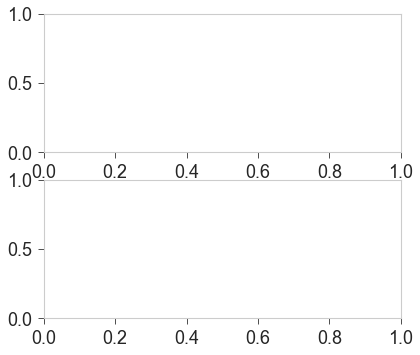

In [65]:
# Background2().dec_linear(xp=experiments[0], region='C_1s')
fig, ax = plt.subplots(2)
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
bg2 = BG2.dec_linear(xp=trim_exps[0], 
                     region='overview_', ax=ax[1])

In [ ]:
def test_bg_subpots()
    fig, ax = plt.subplots(2)
    BG2 = Background2()
    bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                           xlim = 346, maxit=50, ax=ax[0])
    bglin = BG2.dec_linear(xp=trim_exps[0], 
                         region='overview_', ax=ax[1])

    assert len(ax[0].get_lines()) <= 2, "Too many lines in lin_bg subplot"
    assert len(ax[0].get_lines()) >= 2, "Not enough lines in lin_bg subplot"

In [ ]:
BG2 = Background2()
bg2 = BG2.dec_2shirley(xp=trim_exps[0], region='overview_', 
                       xlim = 346, maxit=50, ax=ax[0])
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
BG2 = Background2()
bg2 = BG2.dec_linear(xp=trim_exps[0], region='overview_')
x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
x,ybg = BG2.bg_handler(bg2, region='overview_')
lentest = len(np.where(y < ybg)[0])
assert lentest == 0, "Background over signal in %i points"%lentest


In [ ]:
def test_method(method):
    BG2 = Background2()
    bg2 = method(xp=trim_exps[0], region='overview_')
    x,y = BG2.bg_handler(xp=trim_exps[0], region='overview_')
    x,ybg = BG2.bg_handler(bg2, region='overview_')
    lentest = len(np.where(y < ybg)[0])
    assert lentest == 0, "Background over signal in %i points"%lentest
test_method(Background2().dec_linear)

## Pre-processing of data FBI on ITO or muscovite
1- ALI injections 1 bar, 1e-4 M (05.07.2020)

# FBI on ITO 100 pulses

At $t_{on}$ = 50 ms and C = 0.1 mM

## Import data

In [3]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)

files = files_new

for f in files:
    print(os.path.split(f)[1])

03082020_ITO_FBI_1e-4M_400pulses_BaClO42_subl.xy
20072020_ITO_Clean.xy
20072020_ITO_FBI_100pulses.xy
28072020_ITO_FBI_1e-4M_400pulses.xy


In [4]:
names = ['ITO_FBI_300pulses_BaClO42_sublim', 'ITO_clean', 'ITO_FBI_100_pulses', 'ITO_FBI_300pulses']#, 'muscovite_clean', 'muscovite_FBI_200_pulses']
label = ['ITO_FBI_300pulses_BaClO42_sublim', 'ITO_clean', 'ITO_FBI_100_pulses', 'ITO_FBI_300pulses']#, 'muscovite_clean', 'muscovite_FBI_200_pulses']


experiments = [xps_data_import(path=f, name=n, label=l) for f,n,l in zip(files, names, label)]
experiments[1].name

'ITO_clean'

## Bg subtraction

In [6]:
regions = experiments[1].dfx.columns.levels[0].values
regions

array(['C1s', 'In3d5/2', 'N1s', 'O1s', 'Sn3d5/2', 'overview_21.5'],
      dtype=object)

In [7]:
regions = experiments[0].dfx.columns.levels[0].values
regions

array(['Ba3d', 'C1s', 'Cl2p', 'Cl2s', 'In3d5/2', 'N1s', 'O1s', 'Sn3d5/2',
       'overview_21.5'], dtype=object)

In [8]:
region = 'In3d5/2'

ITO_FBI_300pulses_BaClO42_sublim
ITO_clean
ITO_FBI_100_pulses
ITO_FBI_300pulses


Text(0.5, 1.0, 'In 3d')

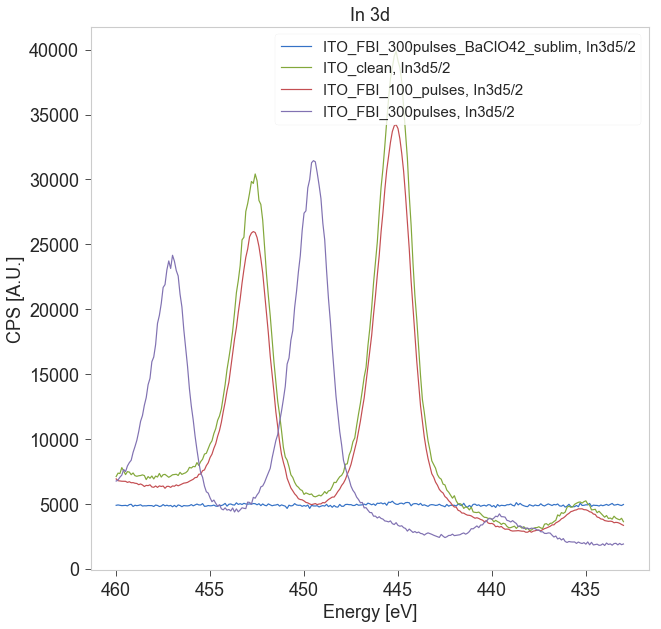

In [10]:
plt.figure(figsize=(10,10))
for xp in experiments:
    print(xp.name)
    plot_region(xp, region)
# plt.xlim(70, 100)
# plt.ylim(1.5e5, 4e5)
cosmetics_plot()
plt.title('In 3d')

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


Text(0.5, 1.0, 'Cu 2p')

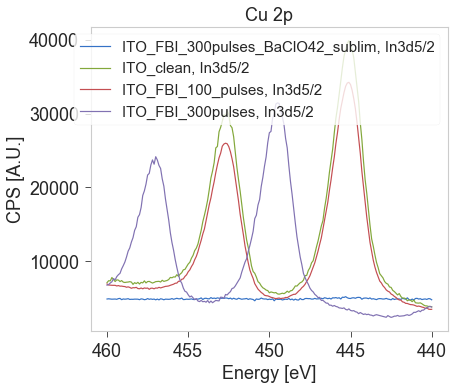

In [11]:
trim_exps = []
# for xp in experiments[:3]+experiments[4:]:
for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=460, edw=440)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
cosmetics_plot()
plt.title('Cu 2p')

### Align spectra

In [12]:
for xp in trim_exps:
    shift = find_shift(xp, xpRef=trim_exps[1], region=region)
    align_dfx(xp, shift, inplace=True)

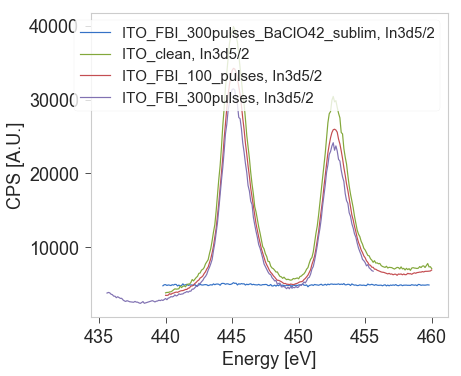

In [14]:
for xp in trim_exps:
    plot_region(xp, region)

### Subtract double shirley to all In regions

In [15]:
region

'In3d5/2'

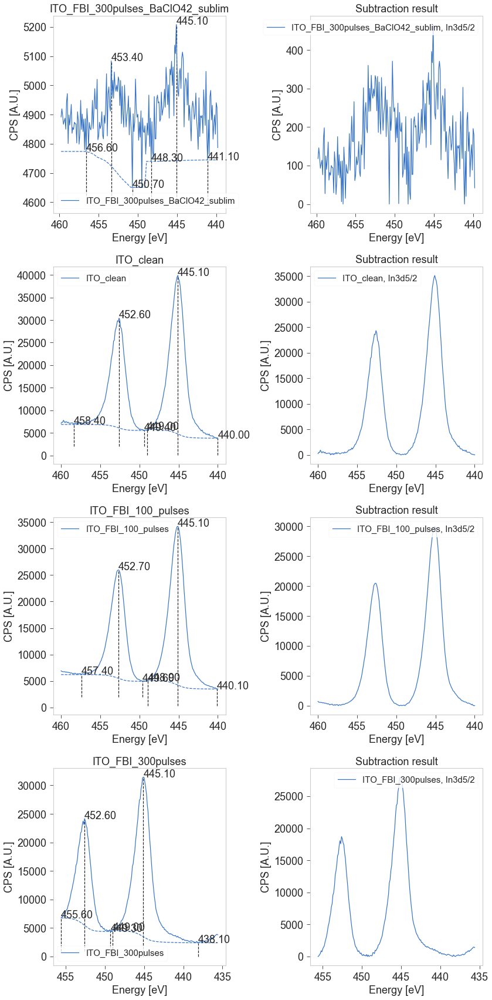

In [16]:
region = 'In3d5/2'

bg_exps = region_2bg_subtract(trim_exps, region=region, xlim=449)

### Bulk subtract background

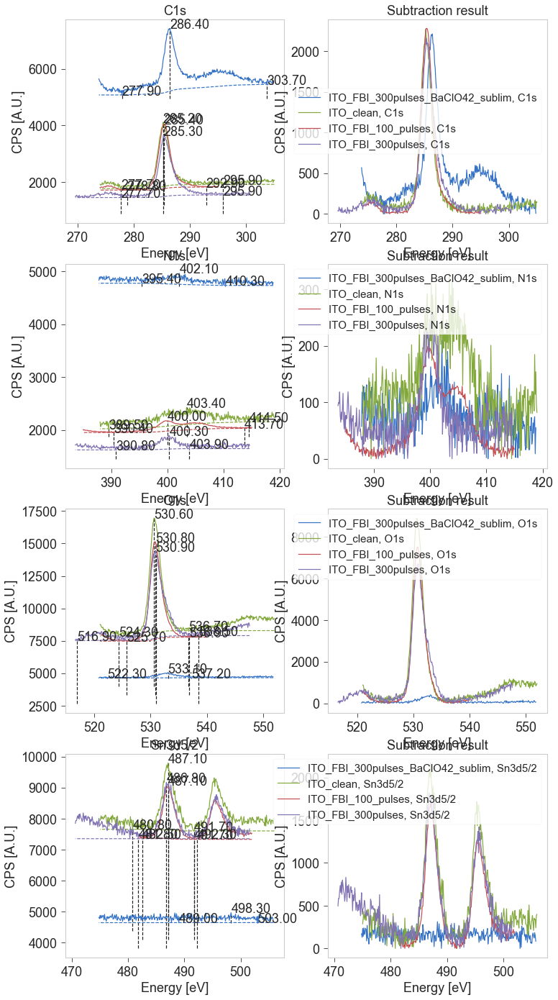

In [17]:
regions = ['C1s', 'N1s', 'O1s', 'Sn3d5/2']
bg_exps = bulk_bg_subtract(bg_exps, regions)

#### Plot result of bulk subtract

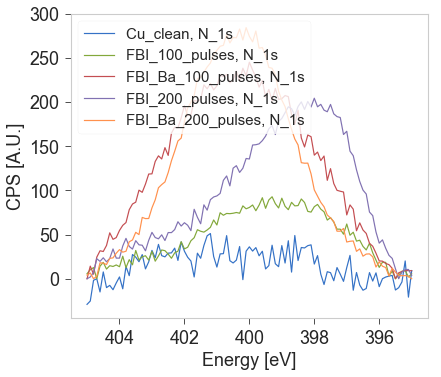

In [74]:
region = 'N_1s'
for xp in bg_exps:
    plot_region(xp, region)

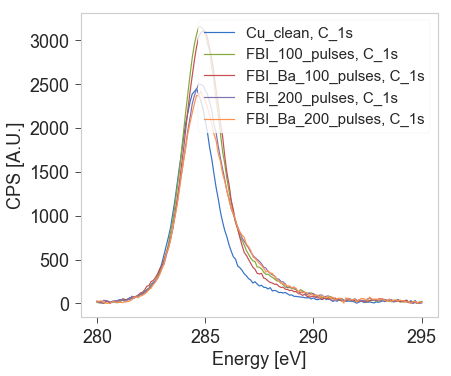

In [75]:
region = 'C_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

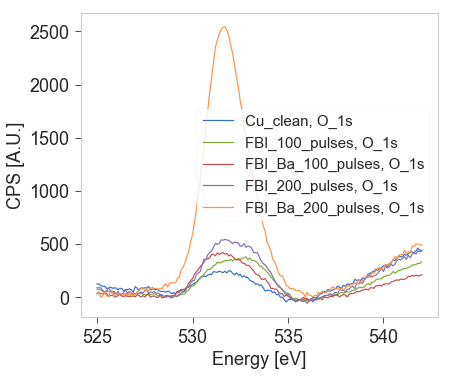

In [76]:
region = 'O_1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

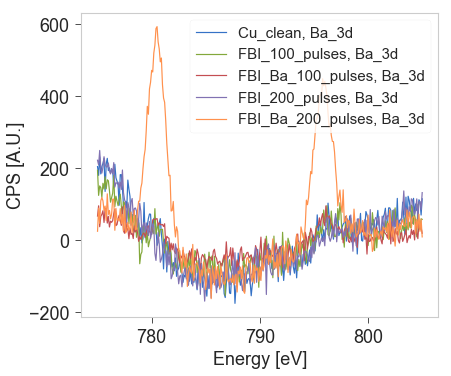

In [77]:
region = 'Ba_3d'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

### Subtract linear and shirley bg to all O 1s regions

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


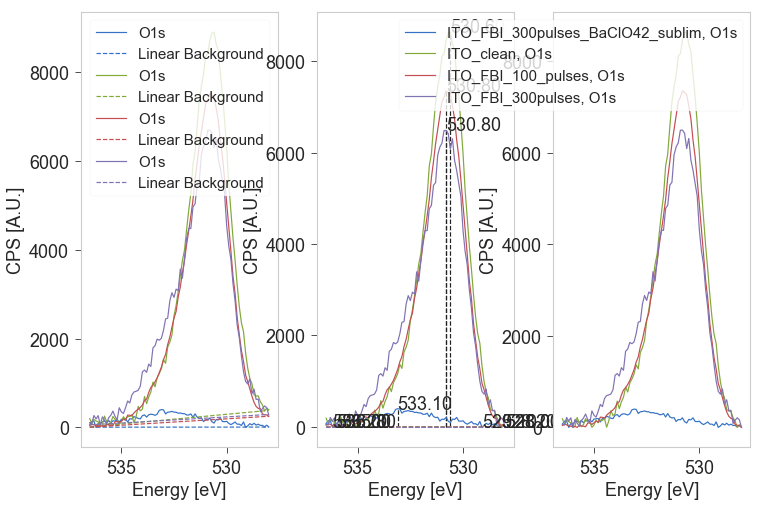

In [18]:
region = 'O1s'
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=536.5, edw=528)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

### Subtract linear and shirley bg to all Ba 3d regions

In [30]:
experiments[2].dfx.columns

MultiIndex(levels=[['Ba3d5/2', 'C1s', 'Cl2s', 'In3d5/2', 'N1s', 'O1s', 'Sn3d5/2', 'Ta19.0', 'Ta19.5', 'Ta21.0', 'Ta21.5', 'Ta22.5', 'Ta_rotado', 'Ta_slit_2', 'overview'], ['counts', 'energy']],
           labels=[[14, 14, 5, 5, 1, 1, 6, 6, 3, 3, 4, 4, 0, 0, 2, 2, 10, 10, 9, 9, 8, 8, 7, 7, 11, 11, 12, 12, 13, 13], [1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]],
           names=['range', 'properties'])

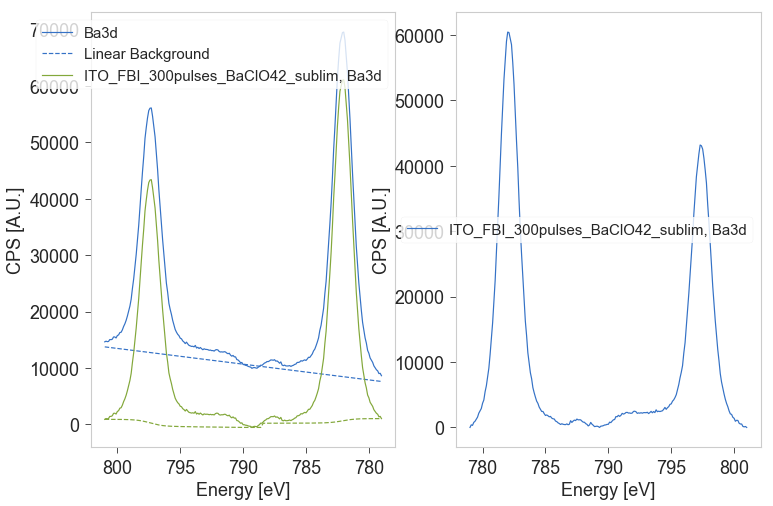

In [46]:
region = 'Ba3d'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

xp = experiments[0]
xp_crop = crop_spectrum(xp, region, eup=None, edw=779)
xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
xp_bg = subtract_double_shirley(xp_lin, region, xlim=788.5, maxit=200, ax=ax[0])
plot_region(xp_bg, region, ax=ax[1])

for i in range(2): cosmetics_plot(ax=ax[i])
bg_exps[0].dfx[region] = xp_bg.dfx[region]

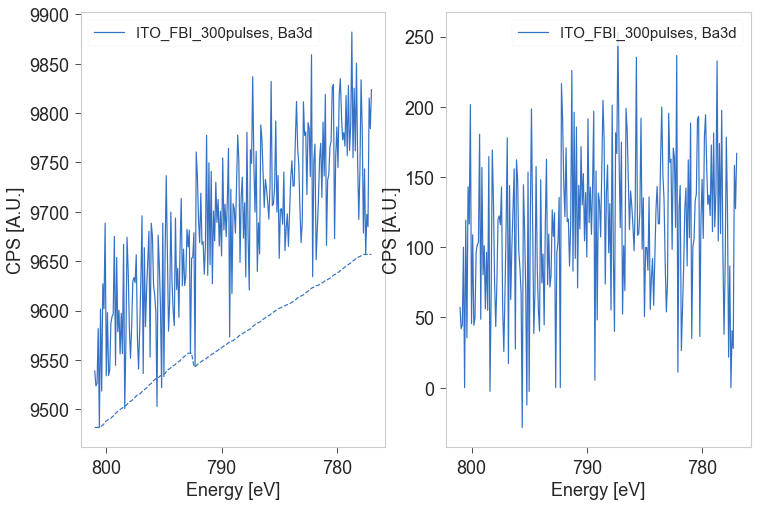

In [37]:
region = 'Ba3d'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

xp = experiments[3]
xp_crop = crop_spectrum(xp, region, eup=None, edw=777)
# xp_lin = subtract_linear_bg(xp, region, ax=ax[0])
xp_bg = subtract_double_shirley(xp_crop, region, xlim=792.5, maxit=100, ax=ax[0])
plot_region(xp_bg, region, ax=ax[1])

for i in range(2): cosmetics_plot(ax=ax[i])
bg_exps[3].dfx[region] = xp_bg.dfx[region]

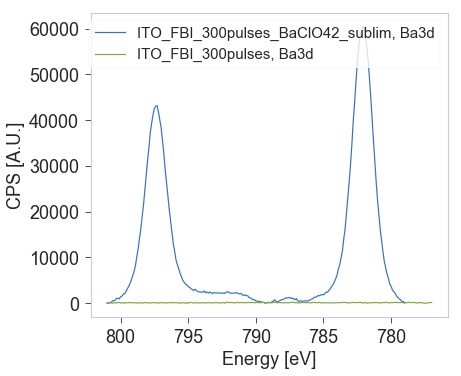

In [47]:
region = 'Ba3d'
for xp in bg_exps:
    if region in xp.dfx.columns:
        plot_region(xp, region)
cosmetics_plot()

In [84]:
bg_exps[4].dfx[region] = xp_bg.dfx[region]

In [85]:
bg_exps[4].dfx[region].max()

properties
energy    805.000000
counts    642.890574
dtype: float64

### Subtract linear and shirley bg to all Cl 2s regions

In [79]:
experiments[0].dfx.columns

MultiIndex(levels=[['Ba3d', 'C1s', 'Cl2p', 'Cl2s', 'In3d5/2', 'N1s', 'O1s', 'Sn3d5/2', 'overview_21.5'], ['counts', 'energy']],
           labels=[[8, 8, 6, 6, 1, 1, 5, 5, 7, 7, 4, 4, 0, 0, 3, 3, 2, 2], [1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]],
           names=['range', 'properties'])

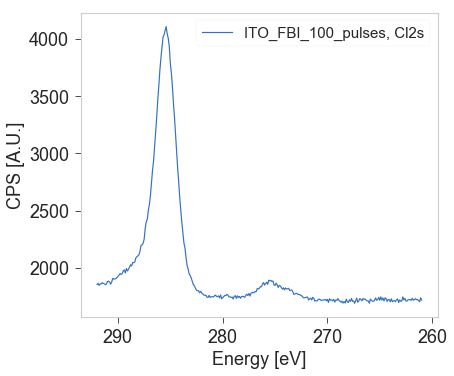

In [235]:
plot_region(experiments[2], region)

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


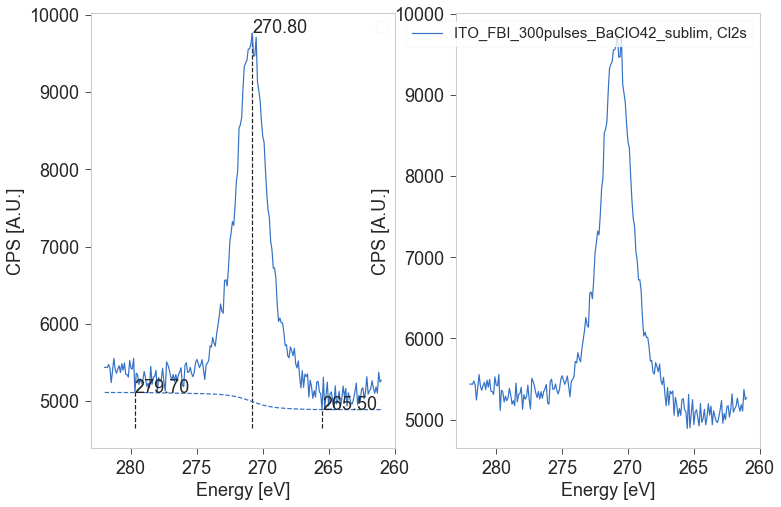

In [233]:
region = 'Cl2s'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

xp = experiments[0]
xp_crop = crop_spectrum(xp, region, eup=282, edw=None)
xp_bg = subtract_shirley_bg(xp_crop, region, maxit=200, ax=ax[0])
plot_region(xp_crop, region, ax=ax[1])

for i in range(2): cosmetics_plot(ax=ax[i])
bg_exps[0].dfx[region] = xp_bg.dfx[region]

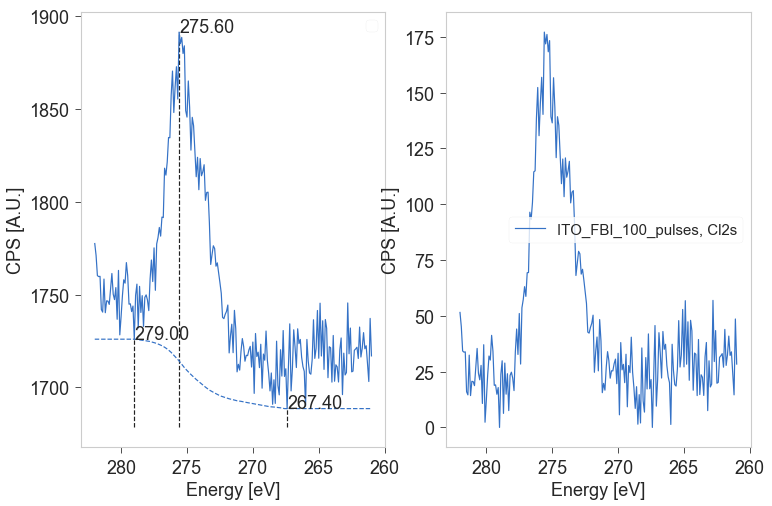

In [234]:
region = 'Cl2s'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

xp = experiments[2]
xp_crop = crop_spectrum(xp, region, eup=282, edw=None)
xp_bg = subtract_shirley_bg(xp_crop, region, maxit=200, ax=ax[0])
plot_region(xp_bg, region, ax=ax[1])

for i in range(2): cosmetics_plot(ax=ax[i])
bg_exps[2].dfx[region] = xp_bg.dfx[region]

### Cl 2p

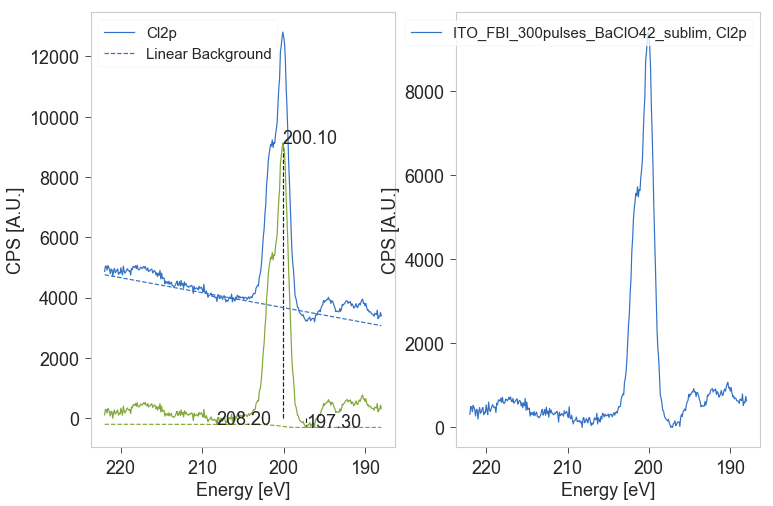

In [238]:
region = 'Cl2p'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

xp = experiments[0]
# xp_crop = crop_spectrum(xp, region, eup=None, edw=282)
xp_lin = subtract_linear_bg(xp, region, ax=ax[0])
xp_bg = subtract_shirley_bg(xp_lin, region, maxit=200, ax=ax[0])
plot_region(xp_bg, region, ax=ax[1])

for i in range(1): cosmetics_plot(ax=ax[i])
bg_exps[0].dfx[region] = xp_bg.dfx[region]

## Scale to In 4d

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


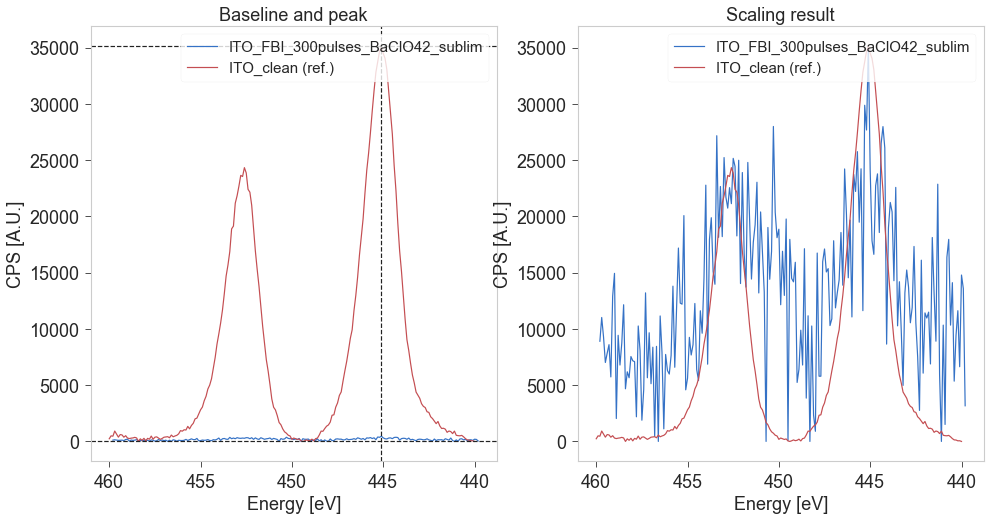

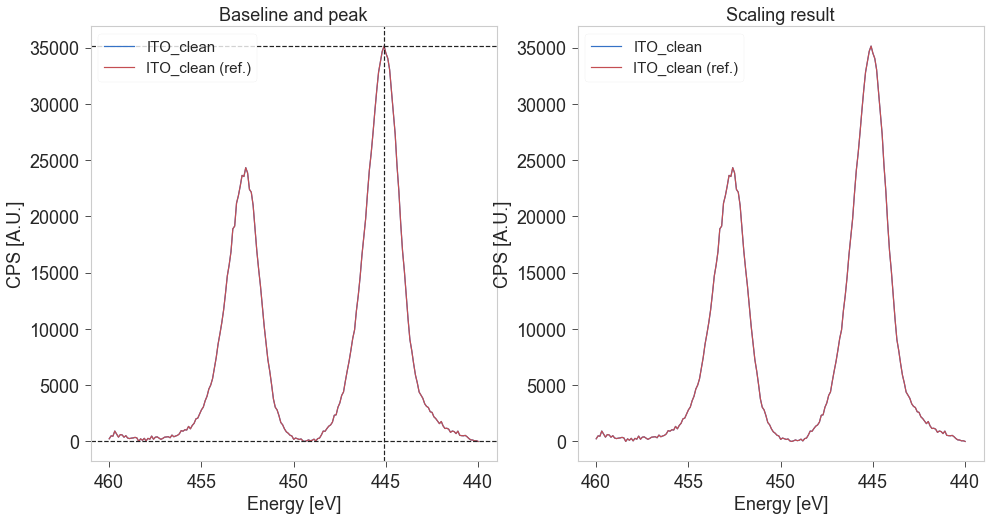

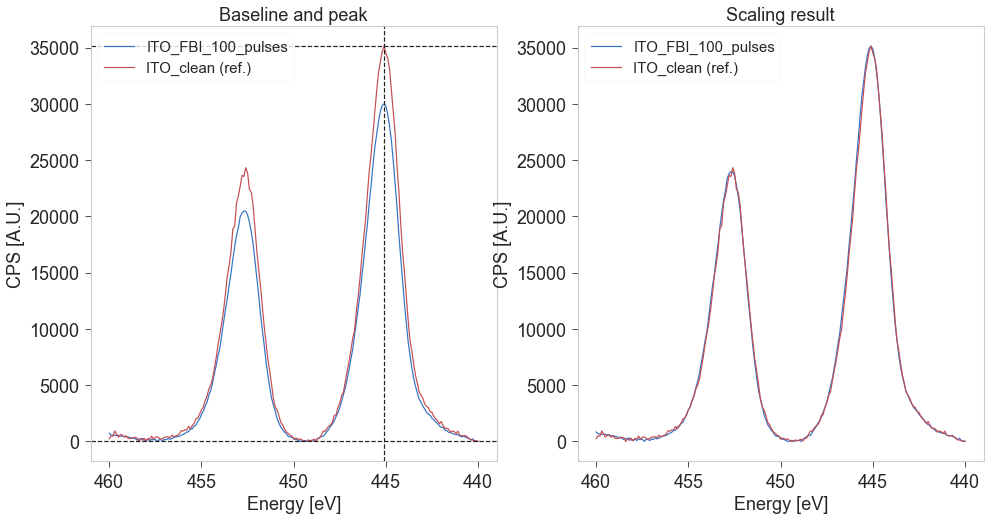

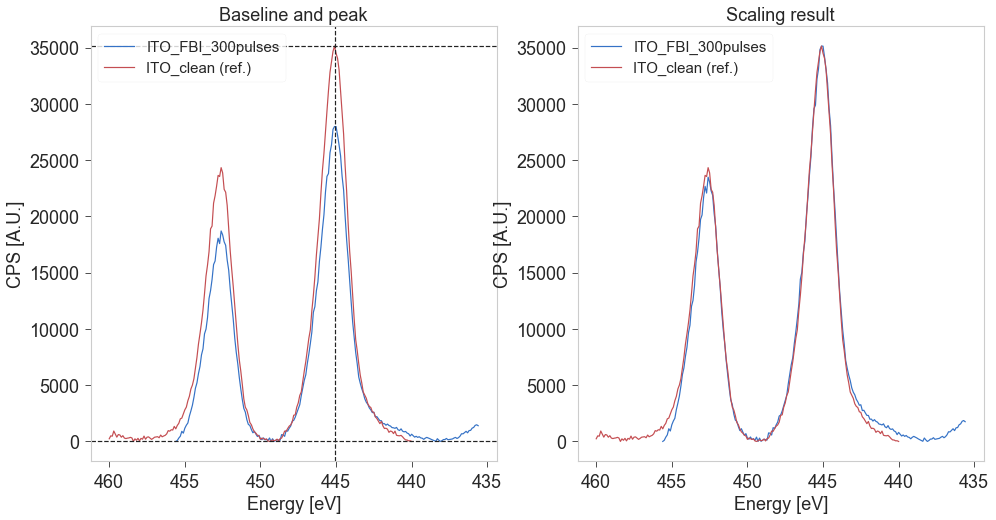

In [239]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[1], region = 'In3d5/2')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

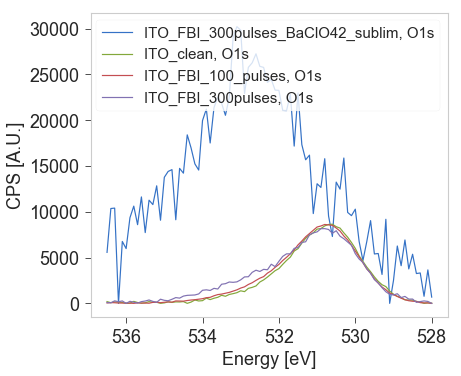

In [225]:
for xp in scaled_exps:
    plot_region(xp, 'O1s')
cosmetics_plot()

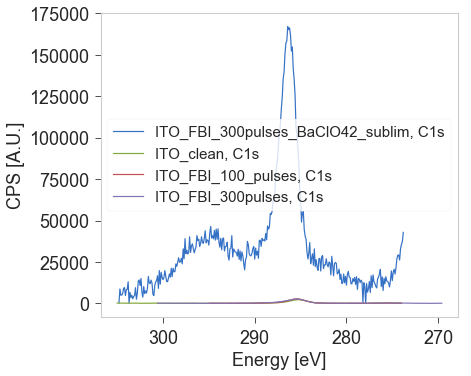

In [226]:
for xp in scaled_exps:
    plot_region(xp, 'C1s')
cosmetics_plot()

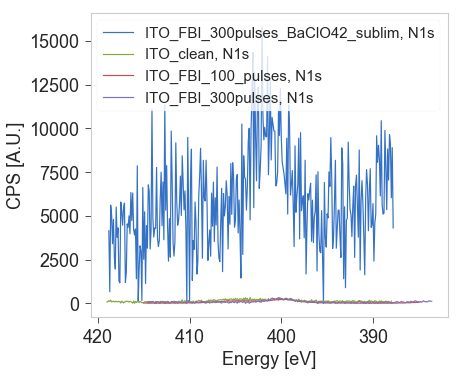

In [227]:
for xp in scaled_exps:
    plot_region(xp, 'N1s')
cosmetics_plot()

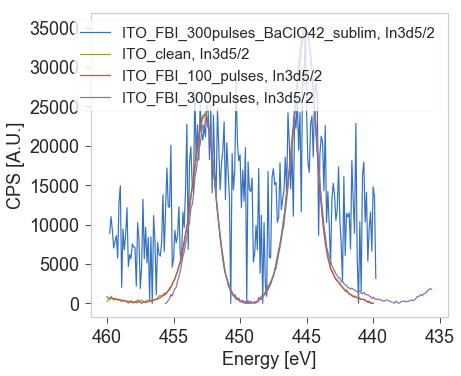

In [228]:
for xp in scaled_exps:
    plot_region(xp, 'In3d5/2')
cosmetics_plot()

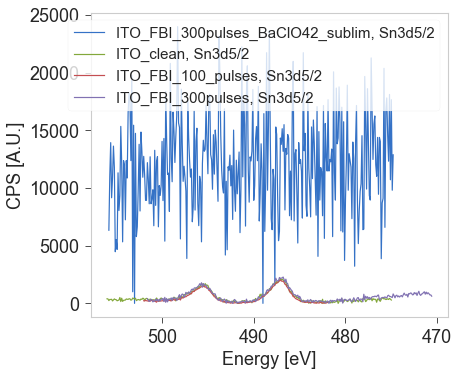

In [55]:
for xp in scaled_exps:
    plot_region(xp, 'Sn3d5/2')
cosmetics_plot()

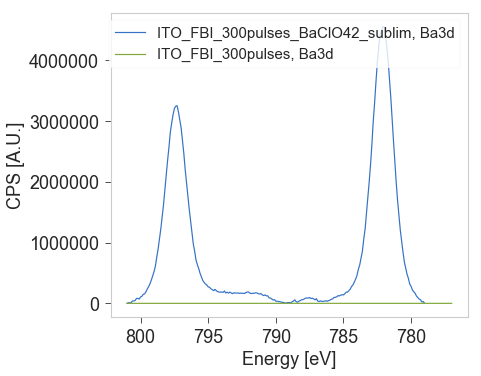

In [58]:
for xp in scaled_exps:
    if 'Ba3d' in xp.dfx.columns:
        plot_region(xp, 'Ba3d')
cosmetics_plot()

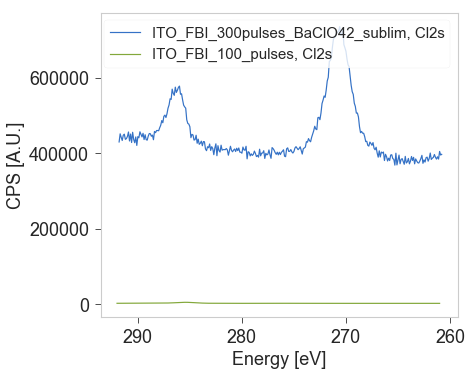

In [229]:
for xp in scaled_exps:
    if 'Cl2s' in xp.dfx.columns:
        plot_region(xp, 'Cl2s')
cosmetics_plot()

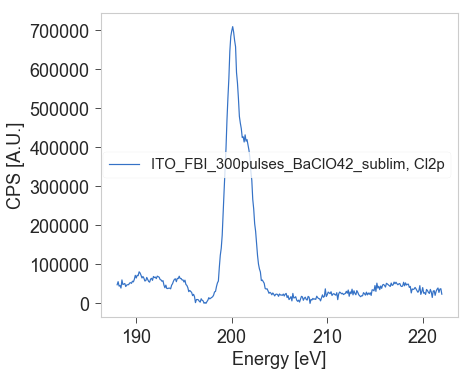

In [240]:
for xp in scaled_exps:
    if 'Cl2p' in xp.dfx.columns:
        plot_region(xp, 'Cl2p')
cosmetics_plot()

## Store processed experiments

In [365]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# Quick fit Ba sublim

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


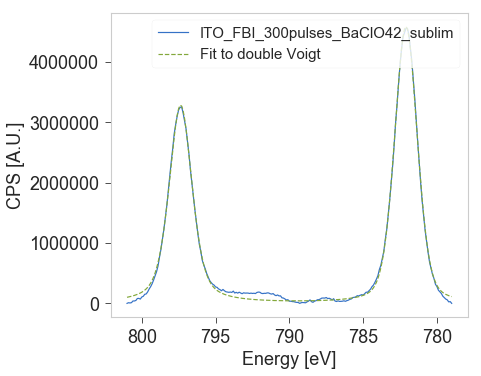

In [93]:
xp_crop = crop_spectrum(scaled_exps[0], region='Ba3d', eup=None, edw=790)
fit_double_voigt(scaled_exps[0], region='Ba3d')

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]
/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/lmfit/models.py:34: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return np.abs(arr-val).argmin()


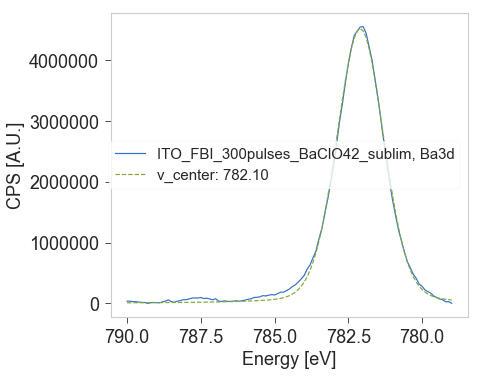

In [96]:
xp_crop = crop_spectrum(scaled_exps[0], region='Ba3d', eup=790, edw=None)
fitv = fit_voigt(xp_crop, region='Ba3d')

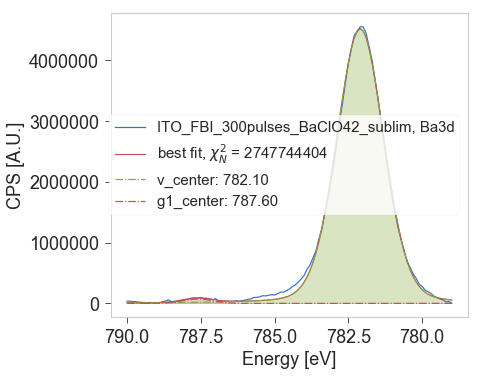

In [102]:
par_g = [3e3, 787, 0.5]
bounds_g = [(1e3, 1e6), (786.5, 788.5), (0.3, 0.7)]
fitvg = add_gauss_shoulder(xp_crop, region='Ba3d', par_g=par_g, bounds_g=bounds_g, fitv=fitv)
cosmetics_plot()

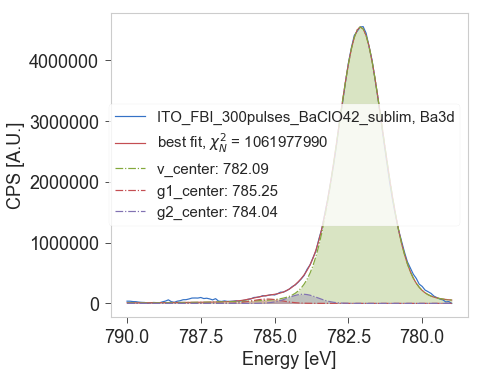

In [108]:
par_g = [3e7, 784.5, 0.5]
bounds_g = [(1e3, 1e8), (784, 786.5), (0.3, 0.7)]
fitvgg = add_gauss_shoulder(xp_crop, region='Ba3d', par_g=par_g, bounds_g=bounds_g, fitv=fitvg, Ng = 2)
cosmetics_plot()

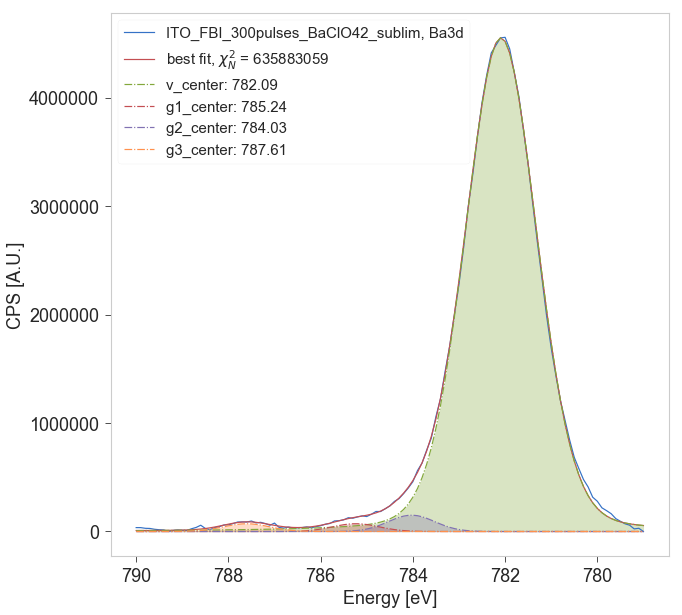

In [110]:
plt.figure(figsize=(10,10))
par_g = [3e3, 787, 0.5]
bounds_g = [(1e3, 1e6), (786.5, 788.5), (0.3, 0.7)]
fitvggg = add_gauss_shoulder(xp_crop, region='Ba3d', par_g=par_g, bounds_g=bounds_g, fitv=fitvgg, Ng = 3)
cosmetics_plot()


# FBI on muscovite:

- 200 pulses, At $t_{on}$ = 50 ms and C = 0.1 mM
- G sample: O3 + spray FBI
- F sample: O3 + cookie dip FBI
- F sample: O3 + cookie dip FBI + Ba(ClO4)2


B, C, F, G, H (Ba), I (Ba)

Métodos de limpieza, deposición de FBI y Ba (muestras H, I):

- B: Piraña + galleta
- C: piraña + spray (aerógrafo)
- F: piraña-O3-piraña + galleta
- G: O3 + spray
- H: O3 + galleta + Ba (spray)
- I: asis (sin tratar) + FBI (spray) + Ba (spray)

## Import data

In [5]:
path = '/Users/pabloherrero/sabat/xps_spectra/muscovite_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)

files = files_new
files.sort()
for f in files:
    print(os.path.split(f)[1])

04082020_mosko_FBI_G_cookie_BaClO42_subl.xy
06082020_mosko_FBI_F_O3cookie.xy
06082020_mosko_FBI_F_O3cookie_BaClO42_subl.xy
21072020_muscovite_clean.xy
22072020_muscovite_FBI_200pulse.xy


In [18]:
names = ['muscovite_FBI_G_O3spray_BaClO42_subl', 'muscovite_FBI_F_O3cookie', 'muscovite_FBI_F_O3cookie_Ba(ClO4)2', 
         'muscovite_clean', 'muscovite_FBI_200_pulses', ]
label = names

experiments = [xps_data_import(path=f, name=n, label=l) for f,n,l in zip(files, names, label)]
experiments[1].name

'muscovite_FBI_F_O3cookie'

In [11]:
experiments = [xps_data_import(path=f, name=None, label=None) for f in files]

## Bg subtraction

In [15]:
regions = experiments[3].dfx.columns.levels[0]
regions

Index(['Al2s', 'C1s', 'K2p', 'N1s', 'O1s', 'Si2s', 'overview_19.0'], dtype='object', name='range')

In [16]:
'overview' in list(experiments[0].dfx.columns.levels[0].values)[-1]

True

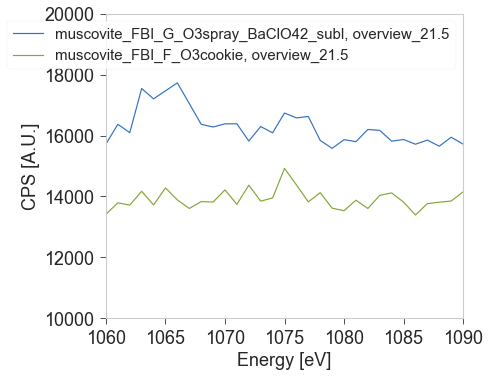

In [19]:
for xp in experiments:
    if 'overview_21.5' in list(xp.dfx.columns.levels[0])[-1]:
        plot_region(xp, 'overview_21.5')

plt.xlim(1090, 1060)
plt.ylim(1e4, 2e4)
cosmetics_plot()

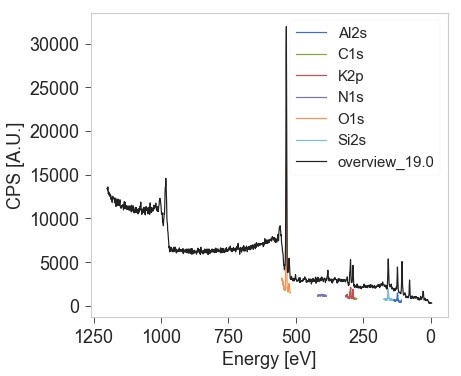

In [23]:
# plot_region(experiments[1], 'overview_21.5')
for r in regions:
    plot_region(experiments[3], r, lb=r)

In [24]:
region = 'Si2s'

muscovite_FBI_G_O3spray_BaClO42_subl
muscovite_FBI_F_O3cookie
muscovite_FBI_F_O3cookie_Ba(ClO4)2
muscovite_clean
muscovite_FBI_200_pulses


Text(0.5, 1.0, 'Si 2s')

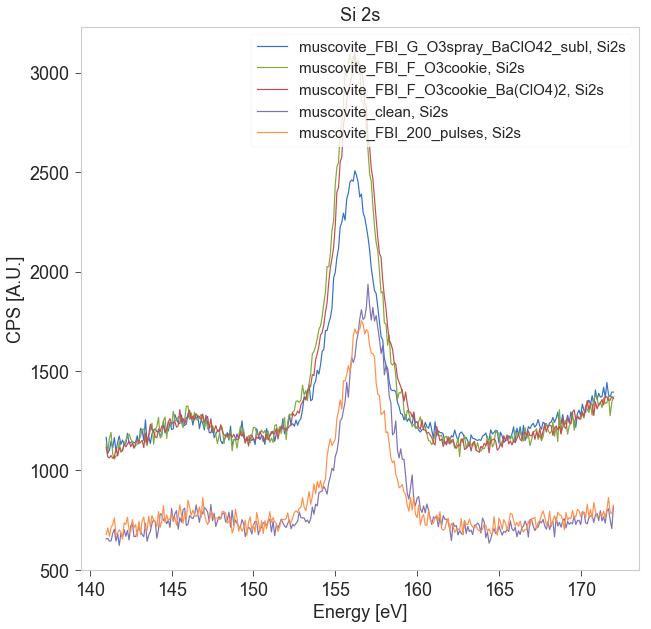

In [25]:
plt.figure(figsize=(10,10))
for xp in experiments:
    print(xp.name)
    plot_region(xp, region)
# plt.xlim(70, 100)
# plt.ylim(1.5e5, 4e5)
cosmetics_plot()
plt.title('Si 2s')

### Trim Si 2s regions

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


Text(0.5, 1.0, 'Si 2s')

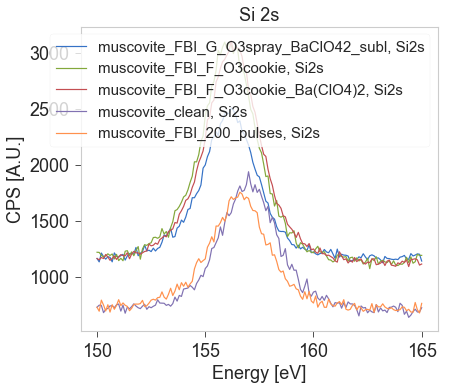

In [26]:
trim_exps = []
region = 'Si2s'
for xp in experiments:
    xp_new = crop_spectrum(xp, region=region, eup=165, edw=150)
    trim_exps.append(xp_new)
    plot_region(xp_new, region)
cosmetics_plot()
plt.title('Si 2s')

### Align Si regions

In [27]:
for xp in trim_exps:
    shift = find_shift(xp, xpRef=trim_exps[1], region=region)
    align_dfx(xp, shift, inplace=True)

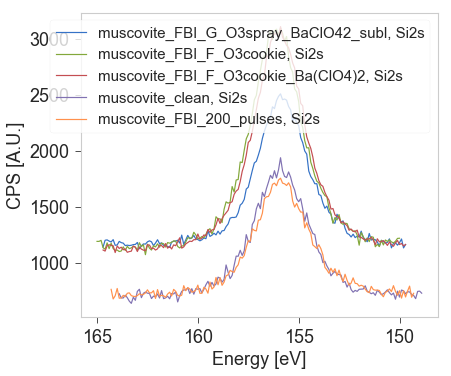

In [28]:
for xp in trim_exps:
    plot_region(xp, region)

### Trim K 2p and C 1s regions

Text(0.5, 1.0, 'C 1s')

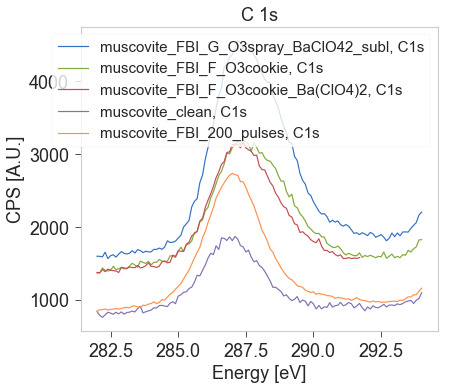

In [29]:
region = 'C1s'
for xp in trim_exps:
    crop_spectrum(xp, region=region, eup=294, edw=282, inplace=True)
    plot_region(xp, region)
#     plot_region(xp, region)

cosmetics_plot()
plt.title('C 1s')

Text(0.5, 1.0, 'K 2p')

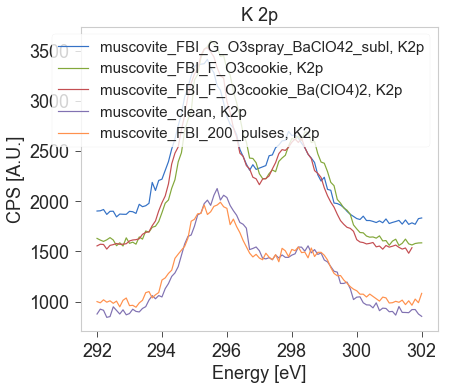

In [31]:
region = 'K2p'
for xp in trim_exps:
    crop_spectrum(xp, region=region, eup=302, edw=292, inplace=True)
    plot_region(xp, region)

cosmetics_plot()
plt.title('K 2p')

### Subtract shirley to all Si regions

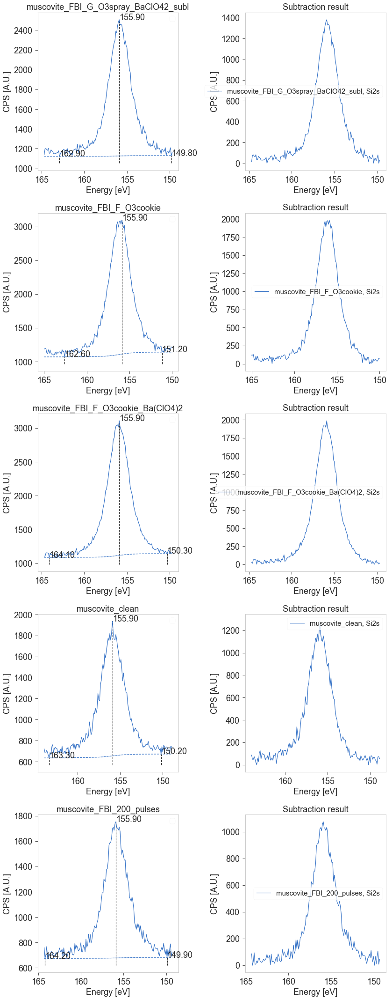

In [32]:
region = 'Si2s'

bg_exps = region_bg_subtract(trim_exps, region=region)

### Bulk subtract background

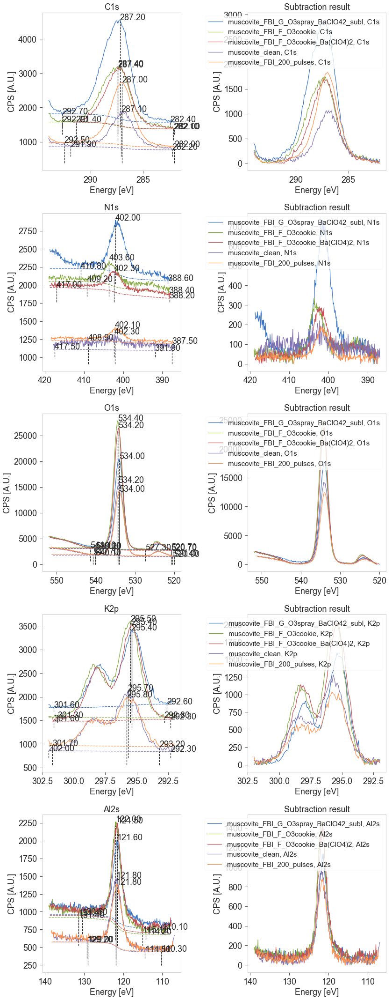

In [33]:
regions = ['C1s', 'N1s', 'O1s', 'K2p', 'Al2s']
bg_exps = bulk_bg_subtract(bg_exps, regions)

#### Plot result of bulk subtract

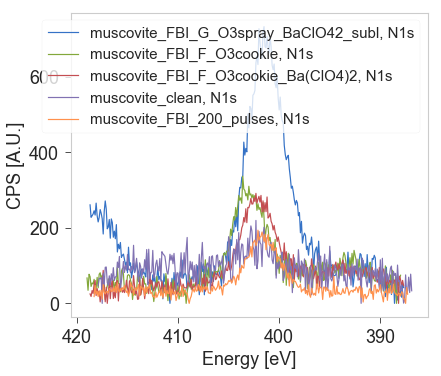

In [25]:
region = 'N1s'
for xp in bg_exps:
    plot_region(xp, region)

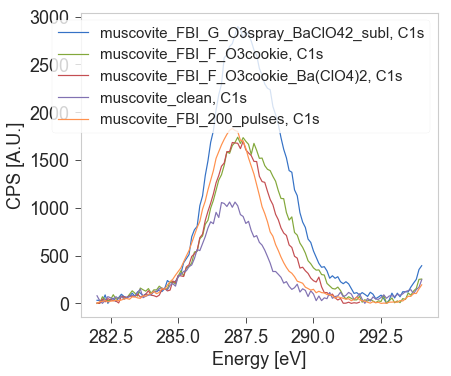

In [26]:
region = 'C1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

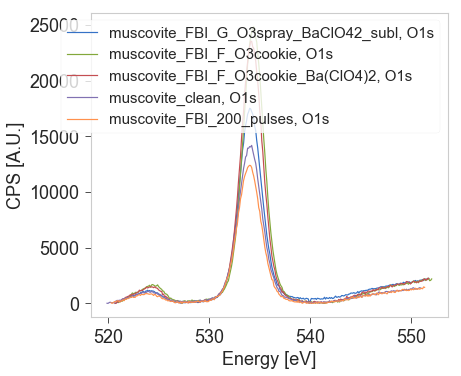

In [27]:
region = 'O1s'
for xp in bg_exps:
    plot_region(xp, region)
cosmetics_plot()

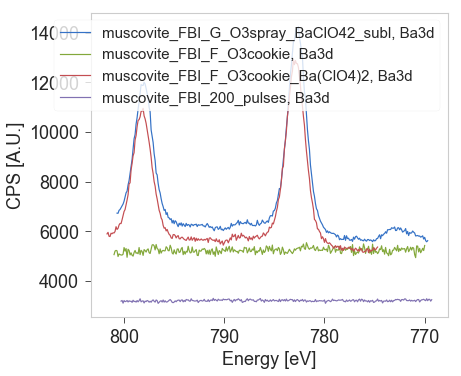

In [28]:
region = 'Ba3d'
for xp in bg_exps:
    try:
        plot_region(xp, region)
    except KeyError:
        pass
cosmetics_plot()

### Subtract linear and shirley bg to all O 1s regions

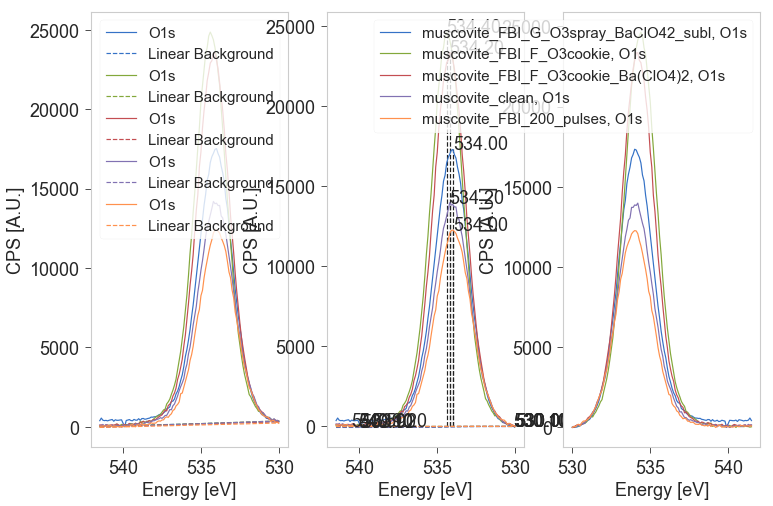

In [34]:
region = 'O1s'
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=541.5, edw=530)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0])
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

### Refine bg subtraction for N 1s regions

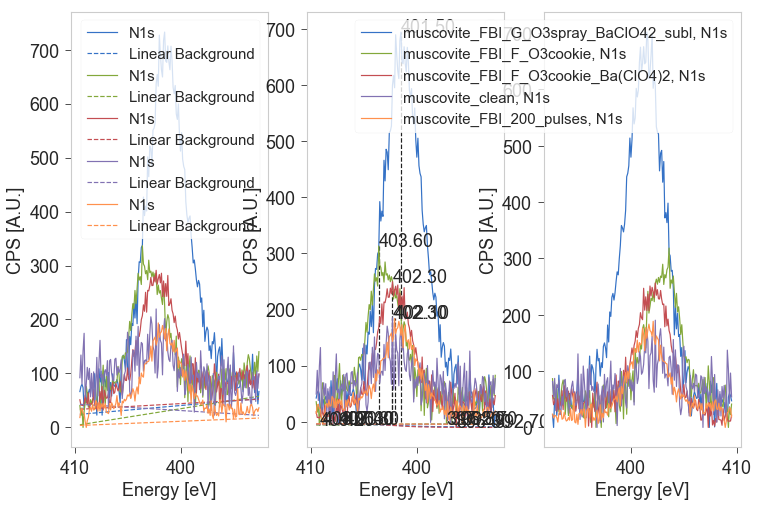

In [35]:
region = 'N1s'
fig, ax = plt.subplots(1, 3, figsize=(12, 8))
new_exps = []
for xp in bg_exps:
    xp_crop = crop_spectrum(xp, region, eup=409.5, edw=392.6)
    xp_lin = subtract_linear_bg(xp_crop, region, ax=ax[0],)
    xp_bg = subtract_shirley_bg(xp_lin, region, maxit=40, ax=ax[1])
    plot_region(xp_bg, region, ax=ax[2])
    new_exps.append(xp_bg)
for i in range(3): cosmetics_plot(ax=ax[i])
bg_exps = new_exps

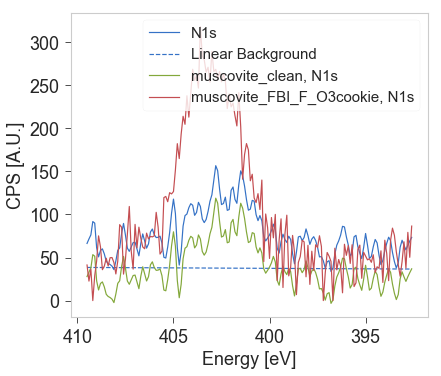

In [36]:
smooth = gaussian_smooth(bg_exps[3], region, sigma=1)
smoothbg = subtract_linear_bg(smooth, region)
plot_region(smoothbg, region)
plot_region(bg_exps[1], region)

### Subtract bg for Ba 3d regions

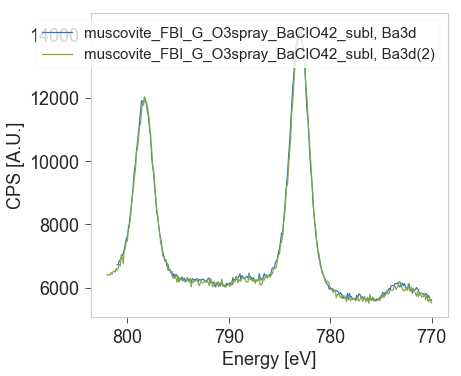

In [37]:
region = 'Ba3d'
plot_region(experiments[0], region)
plot_region(experiments[0], region+'(2)')
cosmetics_plot()

In [616]:
data1 = experiments[0].dfx[region].dropna()
data2 = experiments[0].dfx[region+'(2)'].dropna()

data1.set_index('energy', drop=True, inplace=True)
data2.set_index('energy', drop=True, inplace=True)


if len(data1) > len(data2):
    print('ello')
    data1, data2 = data2, data1
    
ynew = data1.counts.add(data2.counts, fill_value=None)/2

inDif = data2.index.difference(data1.index)
ynew.loc[inDif] = data2.loc[inDif].counts    

plt.plot(x2[::-1], ynew, label='ynew')
plt.plot(x1, y1, label='y1')
plt.xlim(797, 803)
plt.legend()

In [505]:
# if len(x2) > len(x1):
len(y1), len(y2), len(y)

(311, 321, 321)

'Ba3d'  does not exist for xp  muscovite_clean


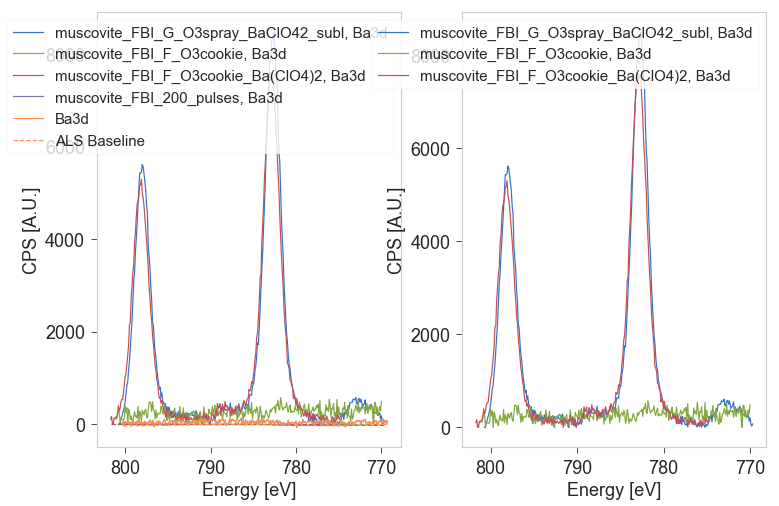

In [39]:
region = 'Ba3d'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
new_exps = []
for i, xp in enumerate(bg_exps):
    try:
        xp_bg = subtract_double_shirley(xp, region, xlim=791, maxit=80, ax=ax[0])
        plot_region(xp_bg, region, ax=ax[1])
        bg_exps[i] = xp_bg
        
    except KeyError as e:
        print(e, ' does not exist for xp ', xp.name)
    except AssertionError:
        xp_bg = subtract_als_bg(xp, region, ax=ax[0])
        bg_exps[i] = xp_bg
        
for i in range(2): cosmetics_plot(ax=ax[i])

###  Subtract bg for Cl 2p

'Cl2p'  does not exist for xp: muscovite_clean
'Cl2p'  does not exist for xp: muscovite_FBI_200_pulses


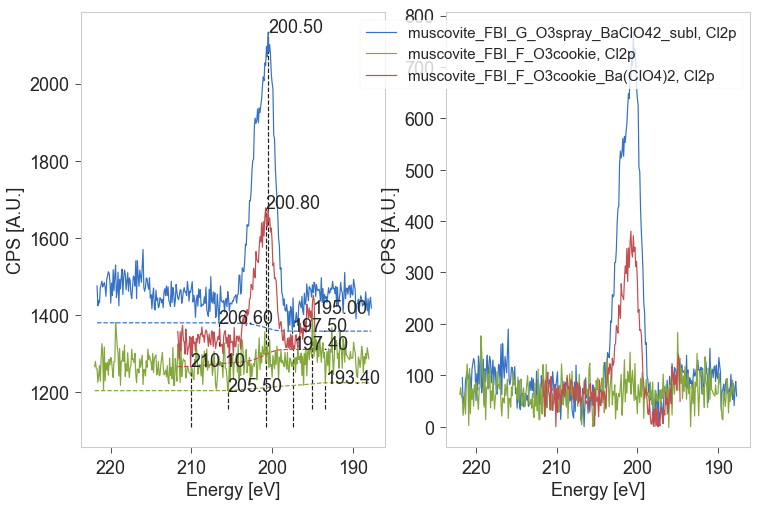

In [40]:
region = 'Cl2p'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
new_exps = []
for i, xp in enumerate(bg_exps):
    try:
        xp_bg = subtract_shirley_bg(xp, region, maxit=50, ax=ax[0])
        plot_region(xp_bg, region, ax=ax[1])
        bg_exps[i] = xp_bg
        
    except KeyError as e:
        print(e, ' does not exist for xp:', xp.name)
    except AssertionError:
        xp_bg = subtract_als_bg(xp, region, ax=ax[0])
        bg_exps[i] = xp_bg
        
for i in range(2): cosmetics_plot(ax=ax[i])

###  Subtract bg for Cl 2s

/Users/pabloherrero/sabat/sabatsw/xps/xps_analysis.py:55: RuntimeWarning: invalid value encountered in greater
  dropup = np.where(xp.dfx[region].energy.values > eup)[0]


'Cl2s'  does not exist for xp: muscovite_clean
'Cl2s'  does not exist for xp: muscovite_FBI_200_pulses


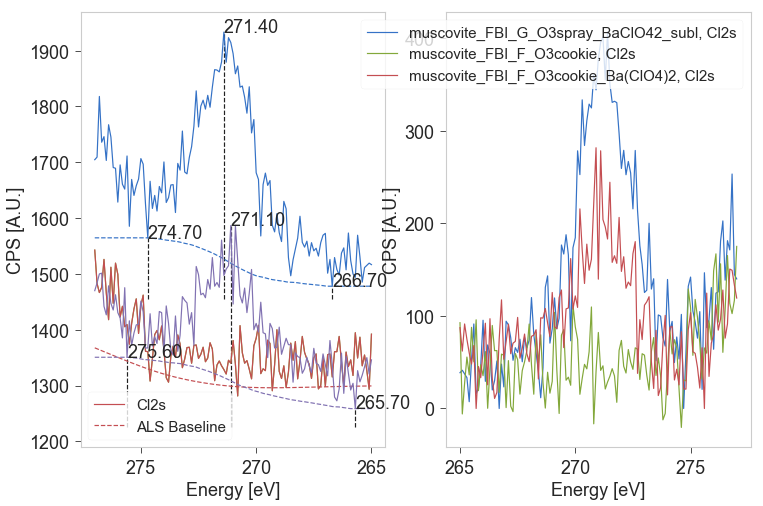

In [41]:
region = 'Cl2s'
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
new_exps = []
for i, xp in enumerate(bg_exps):
    try:
        xp_crop = crop_spectrum(xp, region, eup=277, edw=265)
        xp_bg = subtract_shirley_bg(xp_crop, region, maxit=50, ax=ax[0])
        plot_region(xp_bg, region, ax=ax[1])
        bg_exps[i] = xp_bg
        
    except KeyError as e:
        print(e, ' does not exist for xp:', xp.name)
    except AssertionError:
        xp_crop = crop_spectrum(xp, region, eup=277, edw=265)
        xp_bg = subtract_als_bg(xp_crop, region, ax=ax[0])
        plot_region(xp_bg, region, ax=ax[1])
        bg_exps[i] = xp_bg
        
for i in range(2): cosmetics_plot(ax=ax[i])

## Scale to Si 2s

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


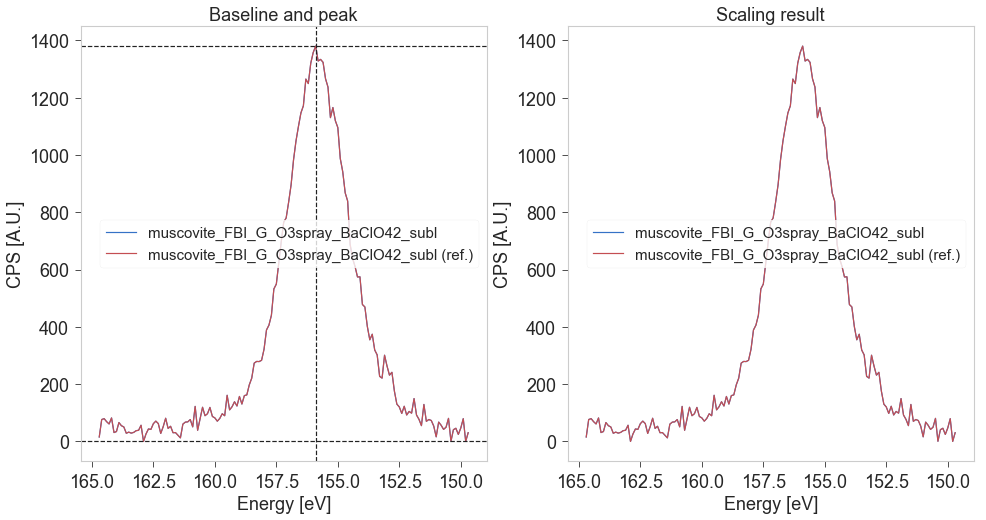

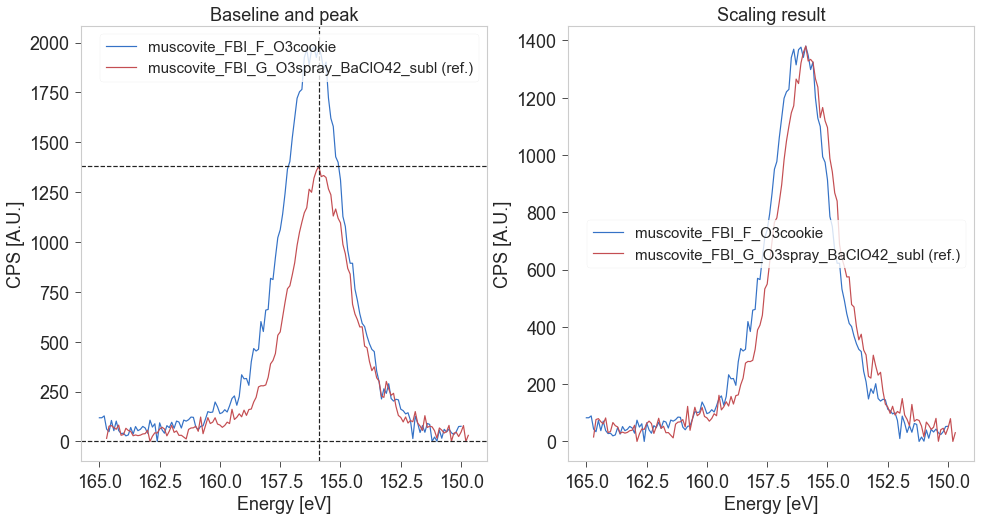

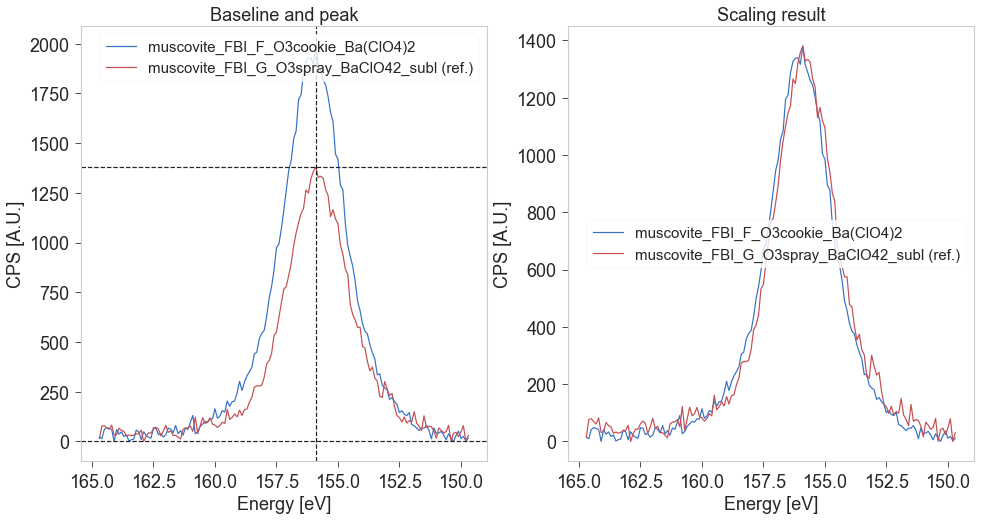

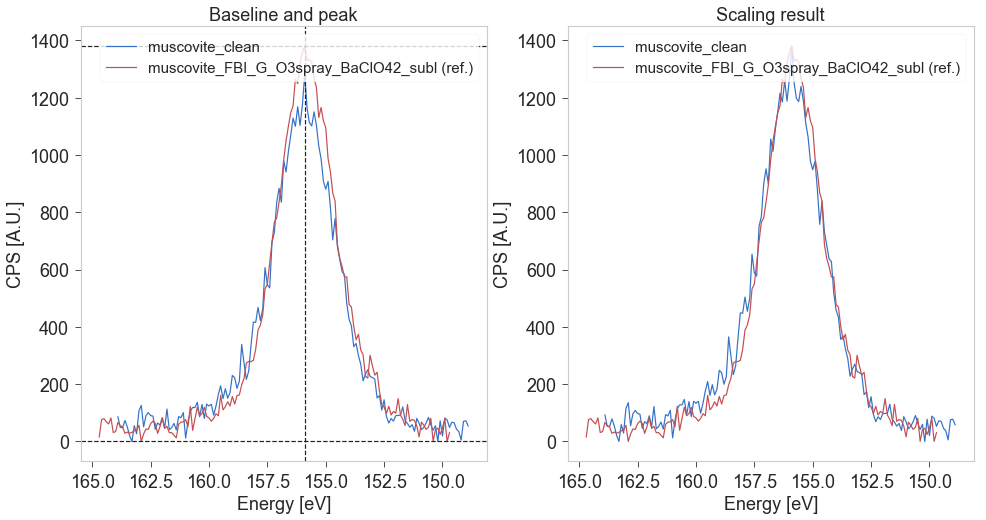

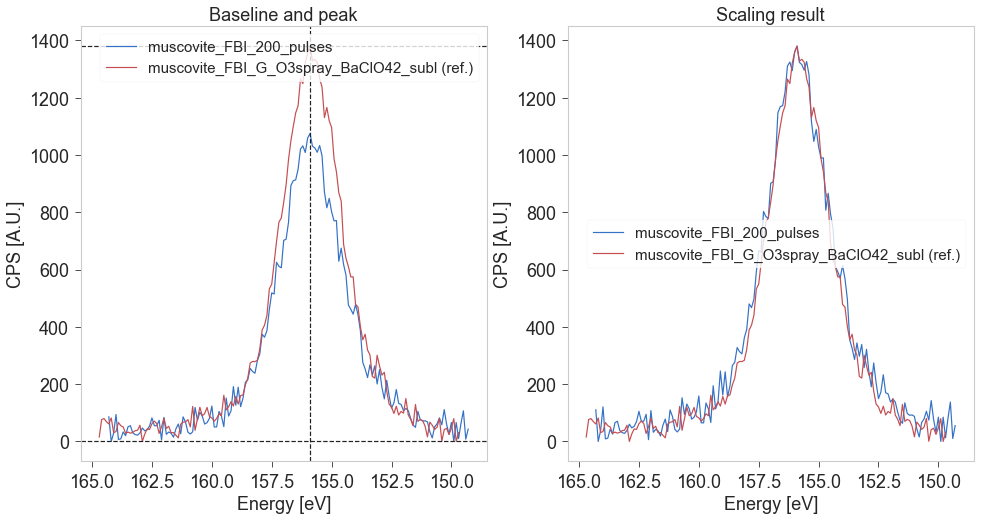

In [42]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'Si2s')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

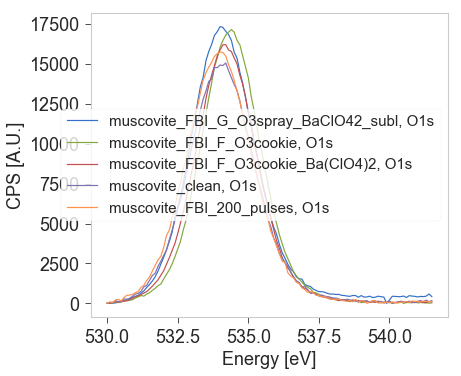

In [43]:
for xp in scaled_exps:
    plot_region(xp, 'O1s')
cosmetics_plot()

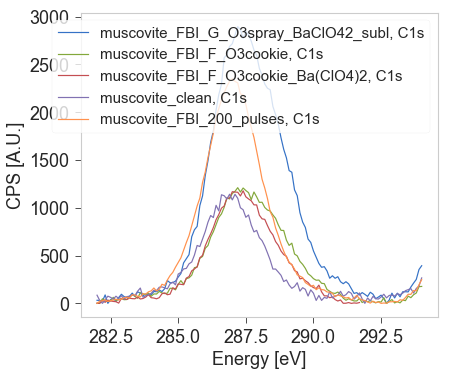

In [44]:
for xp in scaled_exps:
    plot_region(xp, 'C1s')
cosmetics_plot()

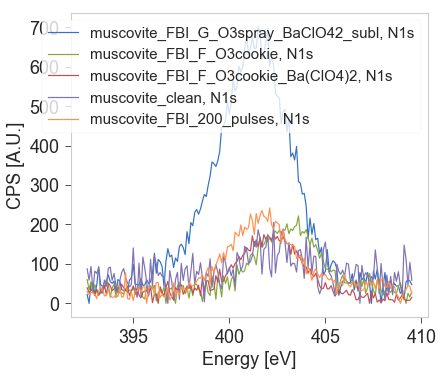

In [45]:
for xp in scaled_exps:
    plot_region(xp, 'N1s')
cosmetics_plot()

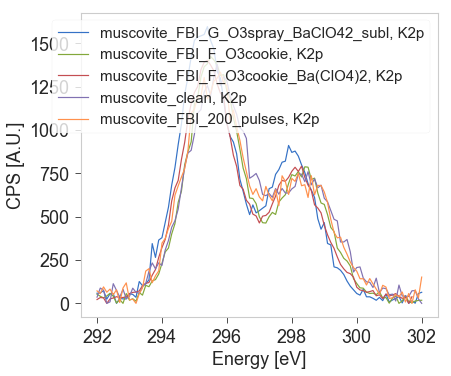

In [46]:
for xp in scaled_exps:
    plot_region(xp, 'K2p')
cosmetics_plot()

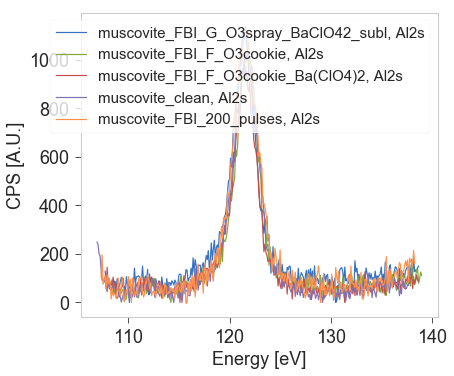

In [43]:
for xp in scaled_exps:
    plot_region(xp, 'Al2s')
cosmetics_plot()

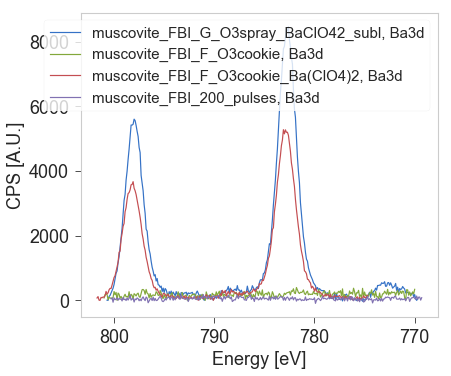

In [47]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Ba3d')
    except KeyError:
        pass
cosmetics_plot()

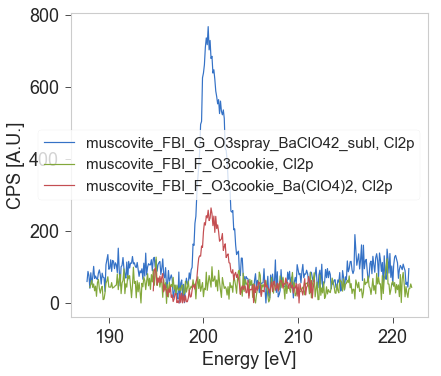

In [61]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Cl2p')
    except KeyError:
        pass
cosmetics_plot()

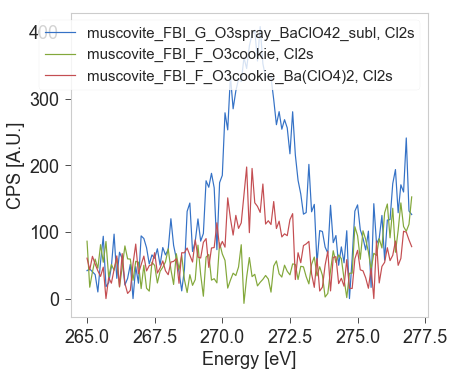

In [62]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Cl2s')
    except KeyError:
        pass
cosmetics_plot()

## Store processed experiments

In [47]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
#     print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

# FBI on quartz:

- D sample: atmosphere-exposed quartz (substrate only)
- A sample: FBI dropcast only
- A sample: FBI dropcast + Ba(ClO4)2 sublimated


## Import data

In [5]:
path = '/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/**/*.xy'
files = glob.glob(path, recursive=True)
files.sort()
files_new = []
for f in files:
    if (' ' not in f) and ('/proc' not in f):
        files_new.append(f)

files = files_new
files.sort()
for f in files:
    print(os.path.split(f)[1])

07082020_quartz_A_FBI_drop.xy
07082020_quartz_A_FBI_drop_BaClO42_sublim.xy
10082020_quartz_atmosphere.xy
12082020_quartz_FBI_ester_1e-4M_200pulses.xy
13082020_quartz_FBI_ester_1e-4M_400pulses.xy
13082020_quartz_FBI_ester_1e-4M_600pulses.xy
13082020_quartz_FBI_ester_1e-4M_800pulses.xy


In [89]:
experiments = [xps_data_import(path=f) for f in files]
experiments[4].name

'quartz_FBI_quartz_FBI_ester_1e-4M_400pulses.xy'

## Align spectra

In [93]:
regions = experiments[2].dfx.columns.levels[0].values
regions

array(['Ba3d', 'C1s', 'Cl2p', 'N1s', 'Na1s', 'Na2p', 'Na2s', 'NaKLL',
       'O1s', 'Si2p', 'Si2s', 'overview_21.5'], dtype=object)

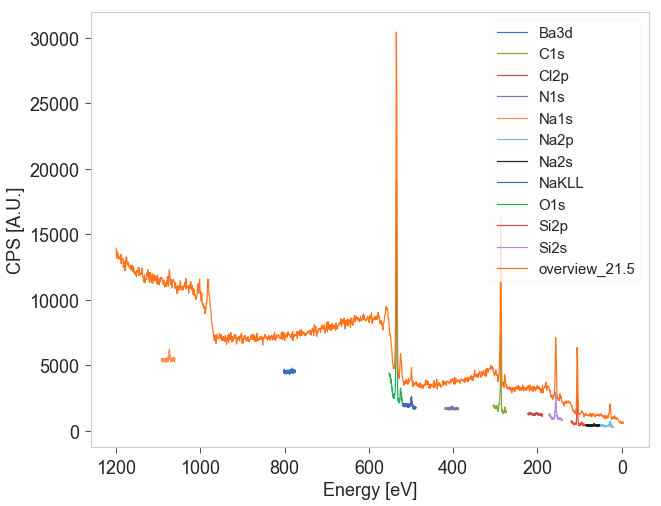

In [96]:
# plot_region(experiments[1], 'overview_21.5')
for r in regions:
    plot_region(experiments[2], r, lb=r)
plt.gcf().set_size_inches((10, 8))
plt.gca().invert_xaxis()

In [97]:
region = 'Si2s'

quartz_FBI_quartz_A_FBI_drop.xy
quartz_FBI_quartz_A_FBI_drop_BaClO42_sublim.xy
quartz_FBI_quartz_atmosphere.xy
quartz_FBI_quartz_FBI_ester_1e-4M_200pulses.xy
quartz_FBI_quartz_FBI_ester_1e-4M_400pulses.xy
quartz_FBI_quartz_FBI_ester_1e-4M_600pulses.xy
quartz_FBI_quartz_FBI_ester_1e-4M_800pulses.xy


Text(0.5, 1.0, 'Si 2s')

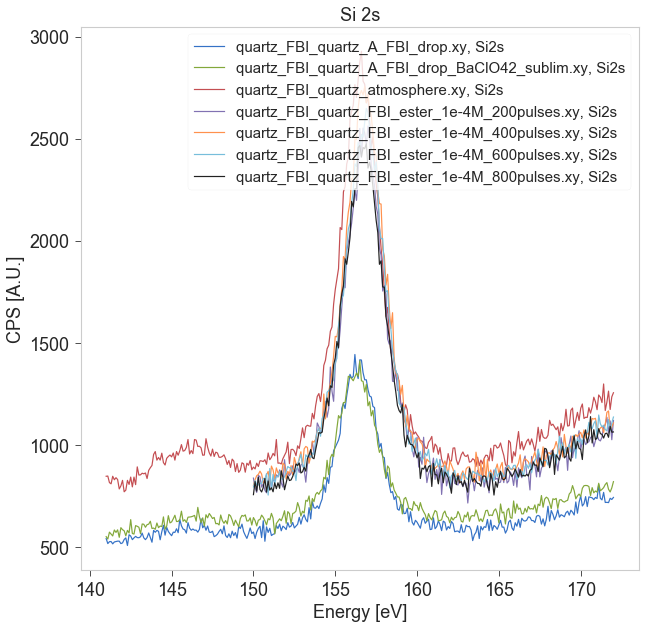

In [98]:
plt.figure(figsize=(10,10))
for xp in experiments:
    print(xp.name)
    plot_region(xp, region)
# plt.xlim(70, 100)
# plt.ylim(1.5e5, 4e5)
cosmetics_plot()
plt.title('Si 2s')

In [99]:
for xp in experiments:
    shift = find_shift(xp, xpRef=experiments[1], region=region)
    align_dfx(xp, shift, inplace=True)

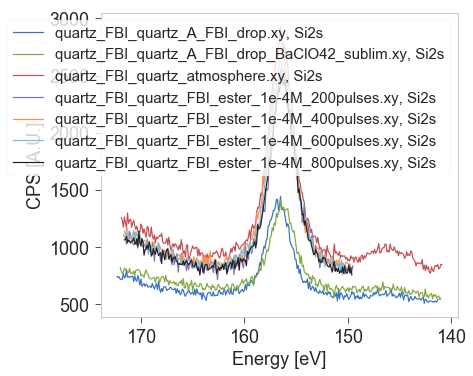

In [100]:
for xp in experiments:
    plot_region(xp, region)

## Bg subtraction

### Refine shirley + ALS subtraction:

In [174]:
def subtract_shirley_bg(xp : XPS_experiment, region : str, maxit : int = 10, als_border: bool = False,
                        lb : str = '__nolabel__', ax = None) -> XPS_experiment:
    """Plot region and shirley background. Decorator for shirley_loop function"""
    x, y = xp.dfx[region].dropna().energy.values, xp.dfx[region].dropna().counts.values
    col = plot_region(xp = xp, region = region, lb = lb, ax = ax).get_color()

    find_integration_limits(x, y, flag_plot=True, region = region, ax = ax)
    ybg = shirley_loop(x, y, maxit = maxit)

    if ax == None: ax = plt.gca()
    ax.plot(x, ybg, '--', color=col, label=lb);
    #cosmetics_plot(ax = ax)

    dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
    xpNew = deepcopy(xp)
    xpNew.dfx[region] = dfnew
    return xpNew

def subtract_shirley_bg(xp : XPS_experiment, region : str, maxit : int = 10, als_border: bool = False,
                        lb : str = '__nolabel__', ax = None) -> XPS_experiment:
    """Plot region and shirley background. Decorator for shirley_loop function"""
    x, y = xp.dfx[region].dropna().energy.values, xp.dfx[region].dropna().counts.values
    col = plot_region(xp = xp, region = region, lb = lb, ax = ax).get_color()

    lmidx, rmidx = find_integration_limits(x, y, flag_plot=True, region = region, ax = ax)
    ybg = shirley_loop(x, y, maxit = maxit)
    
    if als_border:
        yAlsDw = baseline_als(y[:lmidx])
        ybg[:lmidx] = yAlsDw
#     try:
#         yAlsUp = baseline_als(y[rmidx:])
#         ybg[rmidx:] = yAlsUp
#     except ValueError:
#         pass

    if ax == None: ax = plt.gca()
    ax.plot(x, ybg, '--', color=col, label=lb);
    #cosmetics_plot(ax = ax)

    dfnew = pd.DataFrame({'energy' : x, 'counts' : y - ybg})
    xpNew = deepcopy(xp)
    xpNew.dfx[region] = dfnew
    return xpNew

def region_bg_subtract(experiments : list, region = str, als_border: bool = False) -> list:
    """Inspect individual shirley bg subtraction for specified region from several experiments
    Plot results and store them new list of experiments"""
    bg_exps = []
    fig, ax = plt.subplots(len(experiments), 2, figsize=(12, 8 * len(experiments)))
    for j, xp in enumerate(experiments):
        try:
            xp_bg = subtract_shirley_bg(xp, region, maxit=10, als_border=als_border,
                                        lb='__nolabel__', ax = ax[j][0])
        except AssertionError:
            print('Max iterations exceeded, subtract linear baseline')
            xp_bg = subtract_als_bg(xp, region, lb='__nolabel__', ax = ax[j][0])
        bg_exps.append(xp_bg)
        plot_region(xp_bg, region, ax=ax[j][1], lb='__nolabel__')
        ax[j][0].set_title(xp.name)
        ax[j][1].set_title('Subtraction result')
        for i in range(2): cosmetics_plot(ax=ax[j][i])
    fig.tight_layout()
    return bg_exps

In [144]:
x[rmidx], x[-1]

(142.60000000000002, 141.3)

### Subtract shirley to all Si regions

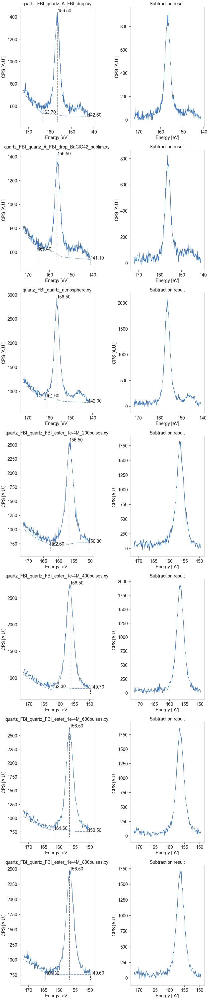

In [187]:
region = 'Si2s'

bg_exps = region_bg_subtract(experiments, region=region, als_border=True)

### Bulk subtract background

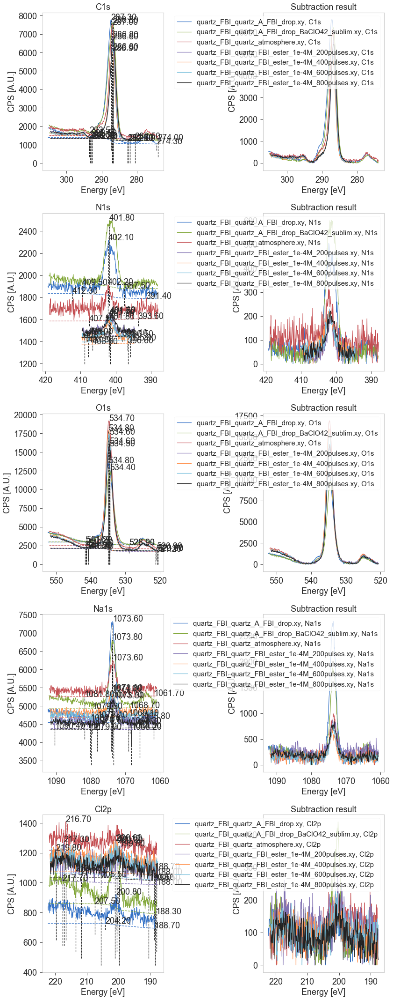

In [188]:
regions = ['C1s', 'N1s', 'O1s', 'Na1s', 'Cl2p']
bg_exps = bulk_bg_subtract(bg_exps, regions)

### Subtract shirley to all Ba regions

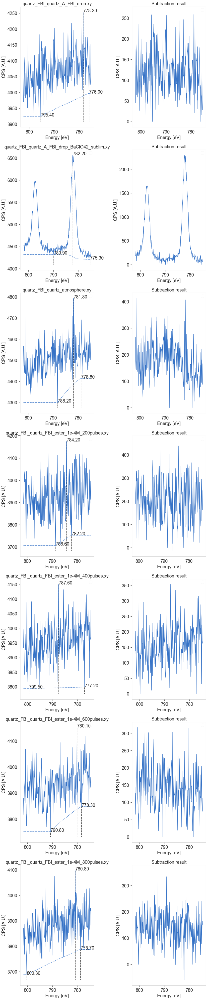

In [189]:
region = 'Ba3d'

bg_exps = region_bg_subtract(bg_exps, region=region)

### Subtract shirley to all Cl regions

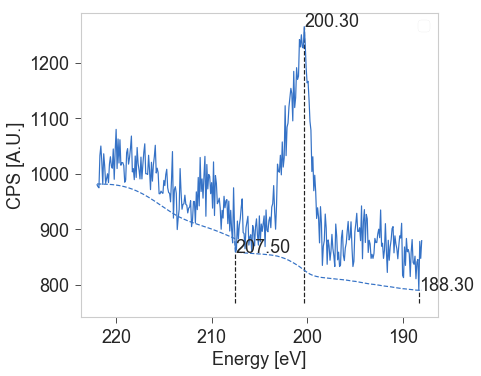

In [190]:
region = 'Cl2p'

correct_cl = subtract_ALShirley_bg(experiments[1], region=region)
bg_exps[1].dfx[region] = correct_cl.dfx[region]

## Scale to Si 2s

/Users/pabloherrero/anaconda3/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 'argmin' is deprecated, use 'idxmin' instead. The behavior of 'argmin'
will be corrected to return the positional minimum in the future.
Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


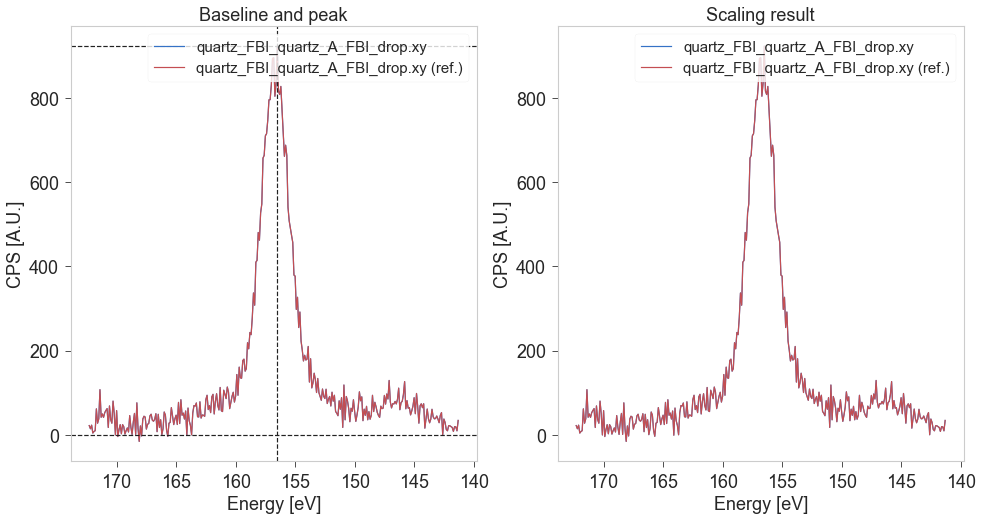

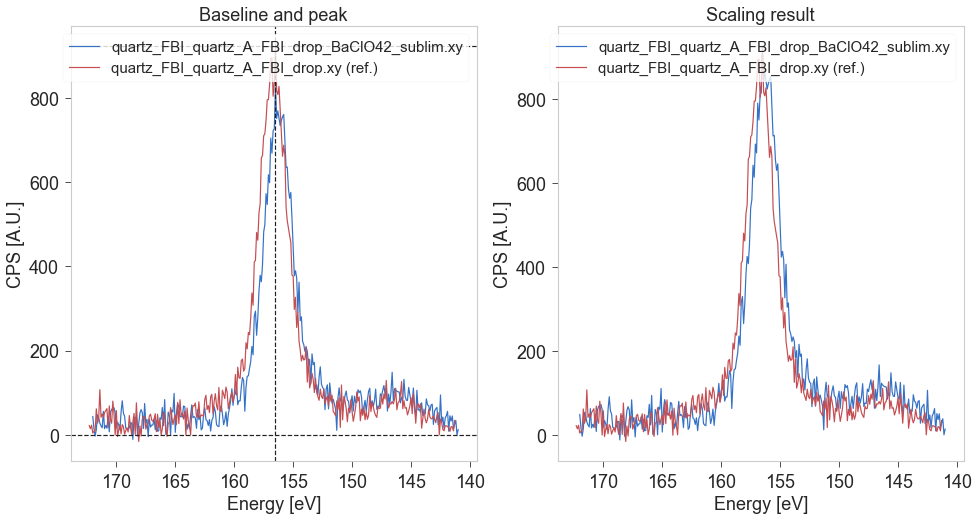

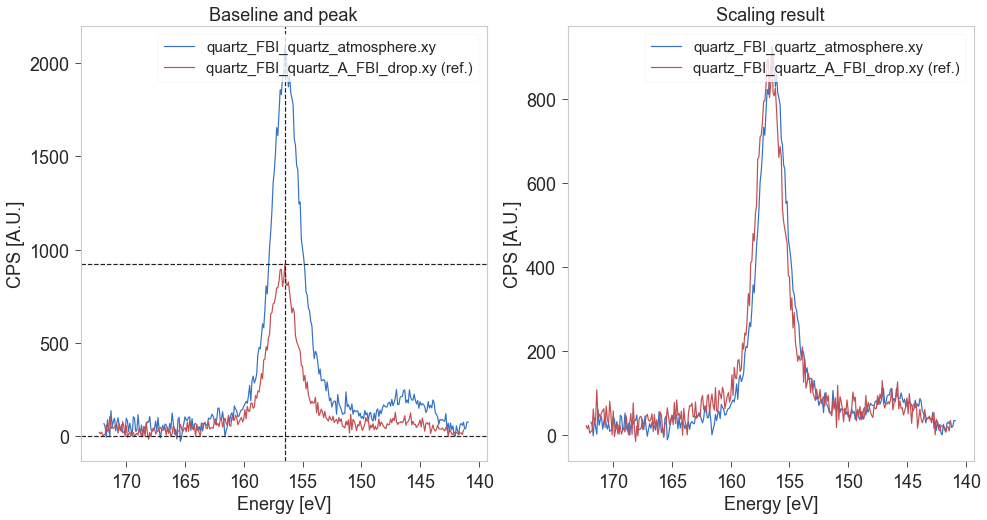

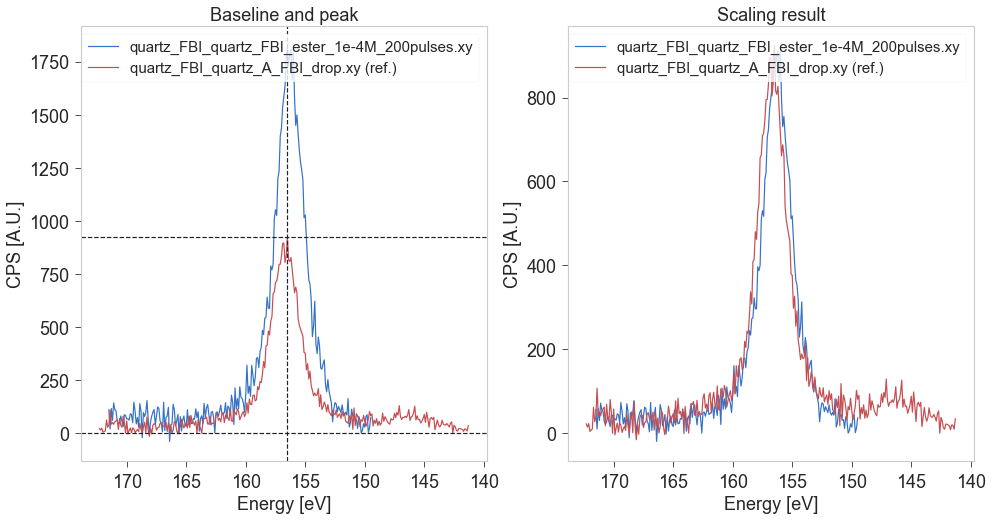

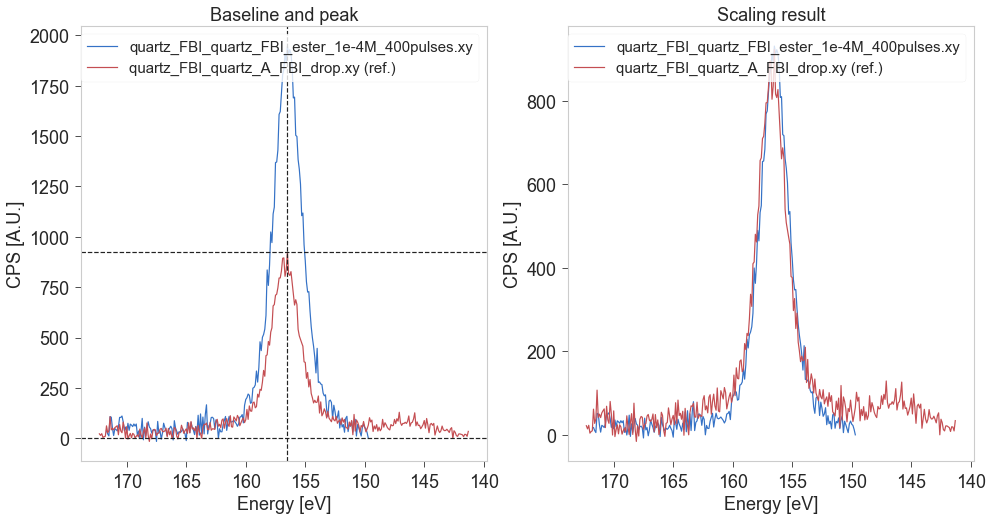

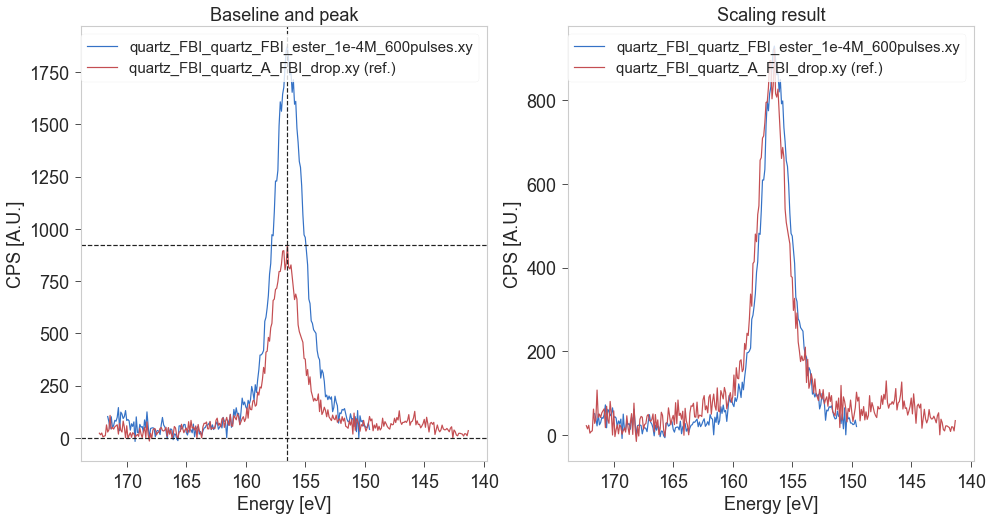

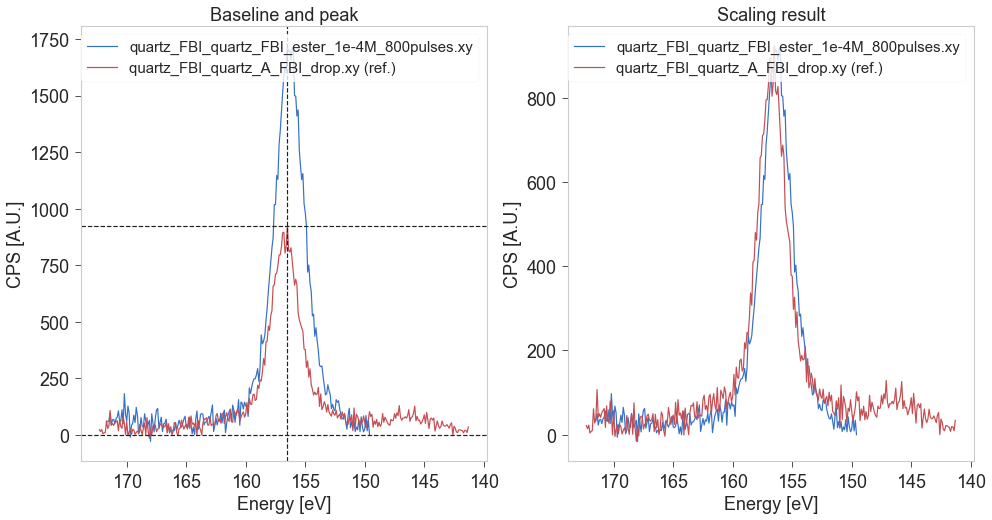

In [191]:
scaled_exps = []
for xpbg in bg_exps:
    scale = scale_and_plot_spectra(xp = xpbg, xpRef = bg_exps[0], region = 'Si2s')
    scaled_exps.append(scale_dfx(xp = xpbg, scale_factor = scale))

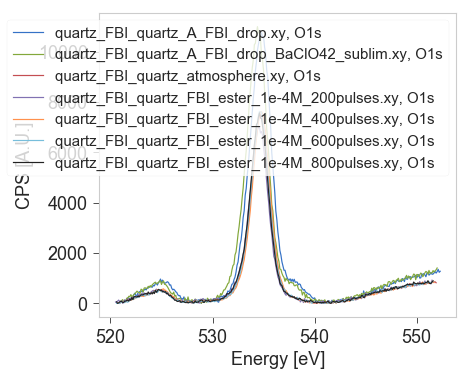

In [192]:
for xp in scaled_exps:
    plot_region(xp, 'O1s')
cosmetics_plot()

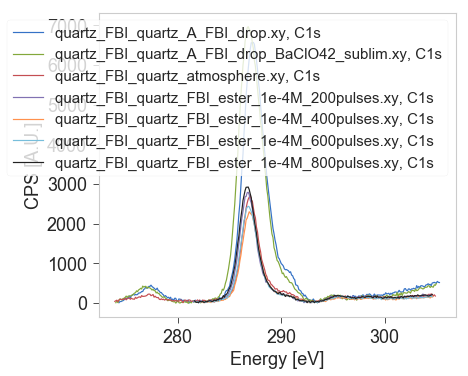

In [193]:
for xp in scaled_exps:
    plot_region(xp, 'C1s')
cosmetics_plot()

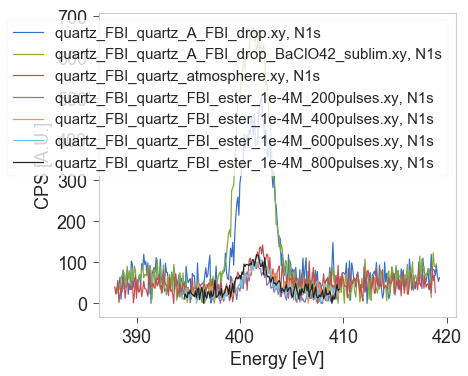

In [195]:
for xp in scaled_exps:
    plot_region(xp, 'N1s')
cosmetics_plot()

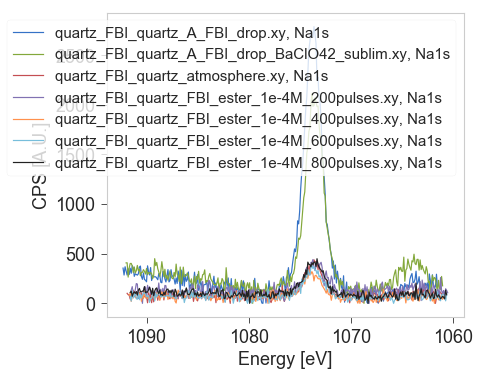

In [194]:
for xp in scaled_exps:
    plot_region(xp, 'Na1s')
# cosmetics_plot()

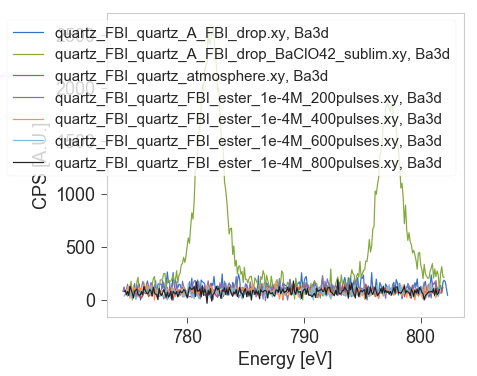

In [196]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Ba3d')
    except KeyError:
        pass
cosmetics_plot()

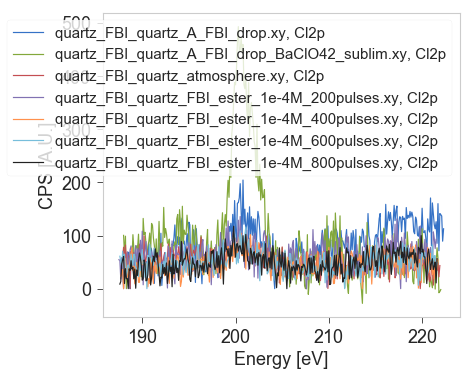

In [197]:
for xp in scaled_exps:
    try:
        plot_region(xp, 'Cl2p')
    except KeyError:
        pass
cosmetics_plot()

## Store processed experiments

In [30]:
scaled_exps[0].dfx

Ba3d              C1s             Cl2p               N1s            \
     energy    counts energy    counts energy     counts energy    counts   
0     802.3   45.3333  305.3  510.0000  222.3  112.66667  419.3   62.6667   
1     802.2  112.0000  305.2  513.6667  222.2   89.33334  419.2   53.3334   
2     802.1  173.3333  305.1  538.0000  222.1  136.66667  419.1   65.3334   
3     802.0  186.6666  305.0  504.3333  222.0  139.33334  419.0   93.6667   
4     801.9  167.3333  304.9  498.6667  221.9  141.33334  418.9   68.3334   
5     801.8   64.6666  304.8  516.0000  221.8   71.33334  418.8   80.6667   
6     801.7  136.6666  304.7  504.3333  221.7  160.00000  418.7   82.6667   
7     801.6  137.3333  304.6  498.0000  221.6   85.33334  418.6   80.0000   
8     801.5   58.6666  304.5  430.0000  221.5  126.00000  418.5  119.3334   
9     801.4   94.0000  304.4  465.0000  221.4  112.66667  418.4   58.0000   
10    801.3  110.0000  304.3  455.6667  221.3  120.66667  418.3   33.0000   
11    801.2   66.0000  304.2  478.6667  221.2  141.33334  418.2   85.0000   
12    801.1   72.0000  304.1  453.0000  221.1  161.33334  418.1   68.6667   
13    801.0  142.0000  304.0  451.3333  221.0   80.66667  418.0   52.6667   
14    800.9  235.3333  303.9  412.3333  220.9  170.66667  417.9   50.0000   
15    800.8  134.0000  303.8  400.3333  220.8  106.66667  417.8   79.0000   
16    800.7   26.6666  303.7  421.3333  220.7  111.33334  417.7  110.0000   
17    800.6  124.0000  303.6  429.0000  220.6  131.33334  417.6   36.0000   
18    800.5   94.6666  303.5  429.3333  220.5   64.66667  417.5   72.6667   
19    800.4  175.3333  303.4  382.3333  220.4   94.66667  417.4   75.0000   
20    800.3  137.3333  303.3  412.6667  220.3  109.33334  417.3  100.6667   
21    800.2   90.6666  303.2  372.6667  220.2  105.33334  417.2   56.0000   
22    800.1   64.0000  303.1  432.3333  220.1  107.33334  417.1   61.3334   
23    800.0  129.3333  303.0  346.0000  220.0  151.33334  417.0   35.6667   
24    799.9   60.0000  302.9  351.3333  219.9  102.00000  416.9   50.0000   
25    799.8   88.6666  302.8  365.0000  219.8   78.00000  416.8   69.0000   
26    799.7  200.0000  302.7  347.6667  219.7  116.66667  416.7   41.0000   
27    799.6  127.3333  302.6  349.3333  219.6   98.66667  416.6   32.3334   
28    799.5  163.3333  302.5  316.3333  219.5  101.33334  416.5   79.0000   
29    799.4  111.3333  302.4  346.6667  219.4  128.66667  416.4  108.0000   
...     ...       ...    ...       ...    ...        ...    ...       ...   
1175    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1176    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1177    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1178    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1179    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1180    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1181    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1182    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1183    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1184    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1185    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1186    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1187    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1188    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1189    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1190    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1191    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1192    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
1193    NaN       NaN    NaN       NaN    NaN        NaN    NaN       NaN   
119

In [199]:
import os
for xp, xpProc in zip(experiments, scaled_exps):
    filepath, filename = os.path.split(xp.path)
    newpath = filepath + '/proc/'
    try:
        os.mkdir(newpath)
    except FileExistsError: pass
    print(newpath + filename)
    write_processed_xp(newpath + filename, xpProc)

/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/07082020_quartz_A_FBI_drop.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/07082020_quartz_A_FBI_drop_BaClO42_sublim.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/10082020_quartz_atmosphere.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/12082020_quartz_FBI_ester_1e-4M_200pulses.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/13082020_quartz_FBI_ester_1e-4M_400pulses.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/13082020_quartz_FBI_ester_1e-4M_600pulses.xy
/Users/pabloherrero/sabat/xps_spectra/quartz_FBI/proc/13082020_quartz_FBI_ester_1e-4M_800pulses.xy
